# Unsupervised Regime Identification for S&P 500

This notebook explores unsupervised learning techniques (t-SNE, K-Means, HMM) to identify market regimes based on derived S&P 500 indicators, specifically focusing on return-volatility feature pairs.

In [1]:
import logging
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import sqlalchemy
from hmmlearn.hmm import GaussianHMM
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score # For K-Means evaluation
from matplotlib.lines import Line2D
import matplotlib.colors as mcolors

# Setup logging
logging.basicConfig(level=logging.INFO, format="%(asctime)s - %(levelname)s - %(message)s")
logger = logging.getLogger()

# Plotting style
plt.style.use("seaborn-v0_8-whitegrid")
sns.set_context("notebook") # "talk" for presentations, "notebook" for smaller plots
plt.rcParams['figure.dpi'] = 100 # Adjust for better resolution in notebook

# Project root (assuming the notebook is in `notebooks/`)
PROJECT_ROOT = Path.cwd().parent
DB_PATH = PROJECT_ROOT / "data" / "db" / "volume" / "quant.db"

# Ensure src is in path if running from notebook
if str(PROJECT_ROOT / "src") not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT / "src"))

## 1. Utility Plotting Function

In [2]:
def plot_price_with_colored_regime_line(price_series, regime_series, num_regimes, title_suffix, ax=None, main_price_label='S&P 500 Price', yscale='linear'):

    if ax is None:
        fig, ax = plt.subplots(figsize=(17, 7))
    
    if num_regimes <= 10:
        colors = sns.color_palette('tab10', num_regimes)
    elif num_regimes <= 20:
        colors = sns.color_palette('tab20', num_regimes)
    else:
        colors = sns.color_palette('hsv', num_regimes)
    
    ax.plot(price_series.index, price_series.values, color='lightgray', lw=1, alpha=0.5, zorder=0)

    aligned_regimes = regime_series.reindex(price_series.index).ffill().bfill()

    for i in range(len(price_series) - 1):
        current_regime = aligned_regimes.iloc[i]
        if pd.isna(current_regime):
            segment_color = 'gray' 
        else:
            segment_color = colors[int(current_regime)]
            
        ax.plot(price_series.index[i:i+2], price_series.iloc[i:i+2], 
                color=segment_color, lw=2)

    legend_elements = [Line2D([0], [0], color=colors[i], lw=2, label=f'Regime {i}') for i in range(num_regimes)]
    if main_price_label:
        legend_elements.append(Line2D([0], [0], color='lightgray', lw=1, label=main_price_label))
        
    ax.legend(handles=legend_elements, title="Legend", loc='upper left')
    
    ax.set_yscale(yscale)
    plot_title = f'S&P 500 Price ({yscale.capitalize()} Scale) with {title_suffix} Regimes'
    ax.set_title(plot_title)
    ax.set_xlabel('Date')
    ax.set_ylabel(f'S&P 500 Adjusted Close ({yscale.capitalize()} Scale)')
    ax.grid(True, which="both", ls="--", alpha=0.7 if yscale == 'log' else 0.5)
    
    plt.tight_layout()
    return ax

## 2. Data Loading and Preparation

Load the `sp500_derived_indicators` data from the SQLite database. We will then select feature pairs (one return column, one volatility column) for analysis.

In [3]:
def load_sp500_derived_indicators(db_engine):
    try:
        with db_engine.connect() as connection:
            df = pd.read_sql_table("sp500_derived_indicators", connection)
        logger.info(f"Successfully loaded 'sp500_derived_indicators' table. Shape: {df.shape}")
        df["date"] = pd.to_datetime(df["date"])
        df.set_index("date", inplace=True)
        df.sort_index(inplace=True)
        return df
    except Exception as e:
        logger.error(f"Error loading data: {e}")
        return pd.DataFrame()

db_engine = sqlalchemy.create_engine(f"sqlite:///{DB_PATH}")

data_df_full = load_sp500_derived_indicators(db_engine)
data_df_full.info()
data_df_full.head()

2025-05-27 14:43:38,306 - INFO - Successfully loaded 'sp500_derived_indicators' table. Shape: (10178, 28)


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 10178 entries, 1985-01-02 to 2025-05-23
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   sp500_open               10178 non-null  float64       
 1   sp500_high               10178 non-null  float64       
 2   sp500_low                10178 non-null  float64       
 3   sp500_close              10178 non-null  float64       
 4   sp500_adjusted_close     10178 non-null  float64       
 5   sp500_volume             10178 non-null  int64         
 6   ret_1d                   10178 non-null  float64       
 7   ret_5d                   10178 non-null  float64       
 8   ret_21d                  10178 non-null  float64       
 9   ret_63d                  10178 non-null  float64       
 10  ret_126d                 10178 non-null  float64       
 11  log_vol_1d               10178 non-null  float64       
 12  log_vol_5d     

,sp500_open,sp500_high,sp500_low,sp500_close,sp500_adjusted_close,sp500_volume,ret_1d,ret_5d,ret_21d,ret_63d,...,ret_5d_zscore_63d,ret_21d_zscore_63d,ret_63d_zscore_63d,ret_126d_zscore_63d,log_vol_1d_zscore_63d,log_vol_5d_zscore_63d,log_vol_21d_zscore_63d,log_vol_63d_zscore_63d,log_vol_126d_zscore_63d,created_at
date,,,,,,,,,,,,,,,,,,,,,
1985-01-02,167.199997,167.199997,165.190002,165.369995,165.369995,67820000,-0.011182,-0.008335,0.010943,0.010881,...,-0.552762,0.617853,-0.385117,0.467319,1.157755,-0.029739,1.086092,-0.273462,-0.127119,2025-05-27 10:14:00
1985-01-03,165.369995,166.110001,164.380005,164.570007,164.570007,88880000,-0.004838,-0.011413,0.010748,0.013113,...,-0.767986,0.590278,-0.323092,0.529816,-0.177954,0.008953,1.063517,-0.285837,-0.186058,2025-05-27 10:14:00
1985-01-04,164.550003,164.550003,163.360001,163.679993,163.679993,77480000,-0.005408,-0.012489,0.001836,0.004665,...,-0.860943,0.176321,-0.479923,0.415983,-0.065897,0.028267,1.119877,-0.230975,-0.071454,2025-05-27 10:14:00
1985-01-07,163.679993,164.710007,163.679993,164.240005,164.240005,86190000,0.003421,-0.012150,0.013202,0.009589,...,-0.856132,0.672997,-0.360613,0.200716,-0.497493,0.039880,0.866038,-0.195369,-0.250849,2025-05-27 10:14:00
1985-01-08,164.240005,164.589996,163.910004,163.990005,163.990005,92110000,-0.001522,-0.019433,0.007557,0.011472,...,-1.319871,0.400294,-0.305669,0.282830,-0.887734,-0.476858,0.805616,-0.184146,-0.288043,2025-05-27 10:14:00


In [15]:
FEATURE_PAIRS = {
    "Ret126d_Vol126d": ("ret_126d", "log_vol_126d"),
    "Ret126d_Vol63d": ("ret_126d", "log_vol_63d"),
    "Ret126d_Vol21d": ("ret_126d", "log_vol_21d"),
    "Ret126d_Vol5d": ("ret_126d", "log_vol_5d"),
    "Ret126d_Vol1d": ("ret_126d", "log_vol_1d"),
}

# Initialize dictionaries to store results from all pairs
kmeans_results_all_pairs = {}
hmm_results_all_pairs = {}

## 3. Unsupervised Regime Analysis (Iterating through Feature Pairs)

We will now iterate through the defined feature pairs, applying t-SNE, K-Means, and HMM for each.

2025-05-27 16:10:04,652 - INFO - 
Analyzing Feature Pair: Ret126d_Vol126d - ['ret_126d', 'log_vol_126d']
2025-05-27 16:10:04,717 - INFO - Shape of feature data for Ret126d_Vol126d after dropna: (10178, 2)
2025-05-27 16:10:04,837 - INFO - Scaled features head for Ret126d_Vol126d:
2025-05-27 16:10:04,845 - INFO - 
--- t-SNE for Ret126d_Vol126d ---


            ret_126d  log_vol_126d
date                              
1985-01-02  0.230270     -0.389545
1985-01-03  0.243145     -0.390998
1985-01-04  0.222987     -0.389126
1985-01-07  0.183906     -0.392633
1985-01-08  0.199324     -0.393454


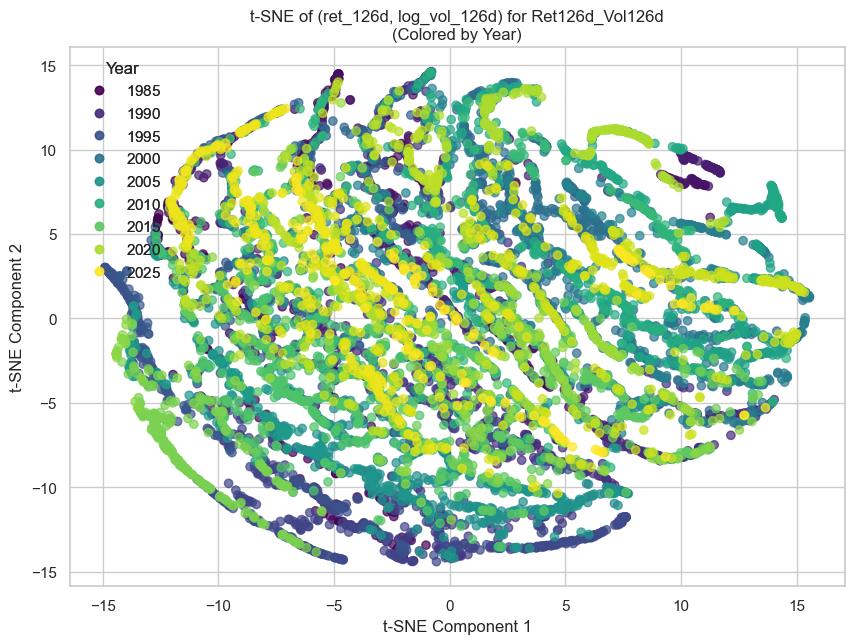

2025-05-27 16:10:22,811 - INFO - 
--- K-Means Clustering for Ret126d_Vol126d ---
2025-05-27 16:10:22,813 - INFO - Forcing K = 3 for K-Means (Ret126d_Vol126d).


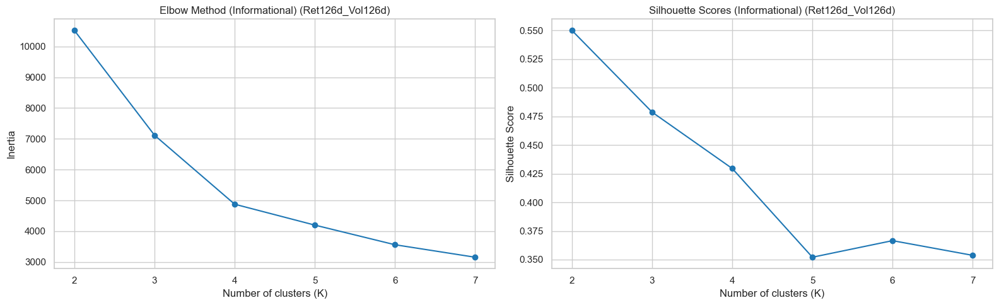

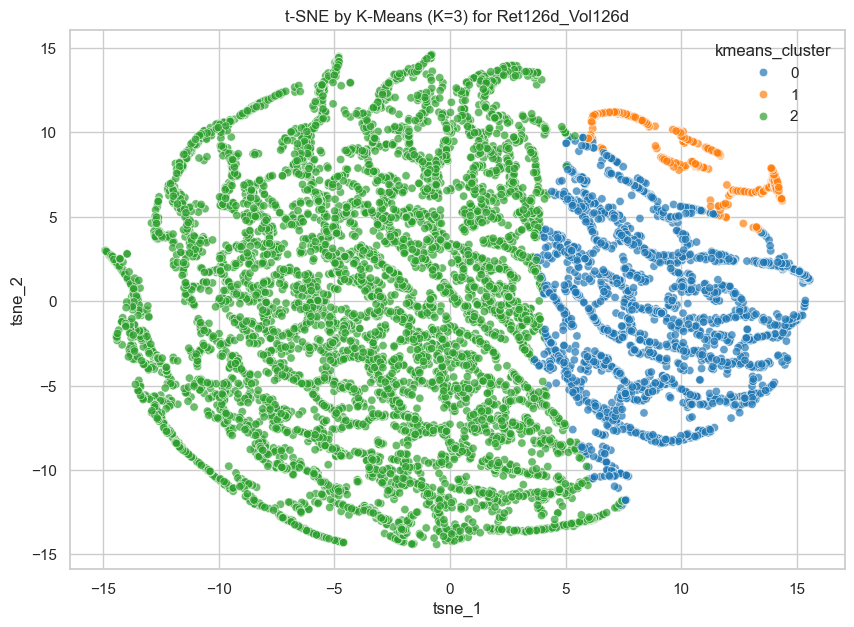

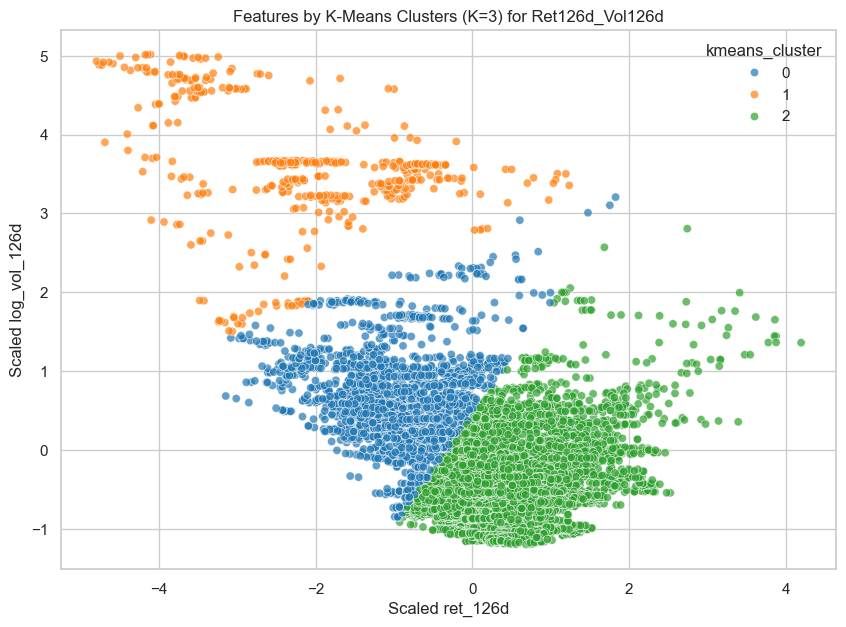

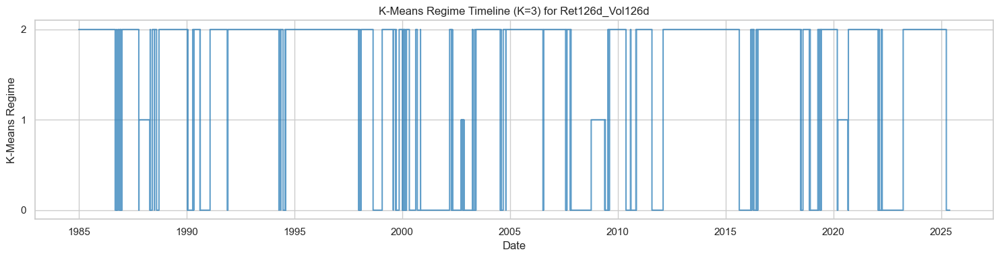

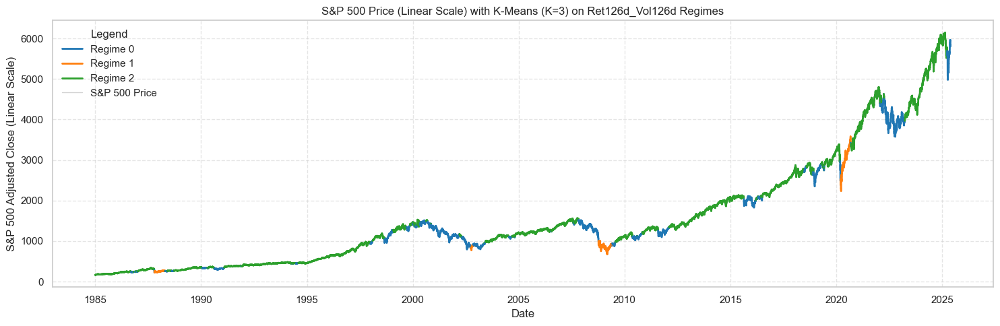

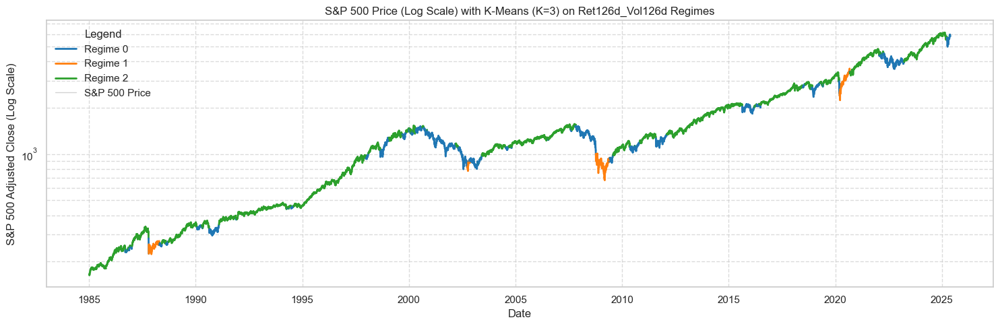

2025-05-27 16:11:13,965 - INFO - 
K-Means Feature Characteristics for Ret126d_Vol126d (Original Scale):
                ret_126d           log_vol_126d          
                    mean       std         mean       std
kmeans_cluster                                           
0              -0.050850  0.065810     0.210357  0.046746
1              -0.178072  0.137951     0.458936  0.064729
2               0.098630  0.068286     0.128268  0.037523
2025-05-27 16:11:13,969 - INFO - 
S&P 500 Performance per K-Means Regime for Ret126d_Vol126d:
   kmeans_cluster  count  mean_daily_return  std_daily_return  \
0               0   2422          -0.000309          0.014602   
1               1    437           0.000396          0.028033   
2               2   7318           0.000657          0.008151   

   annualized_return  annualized_volatility  
0          -0.077783               0.231793  
1           0.099872               0.445003  
2           0.165661               0.129390  
2025-05-2

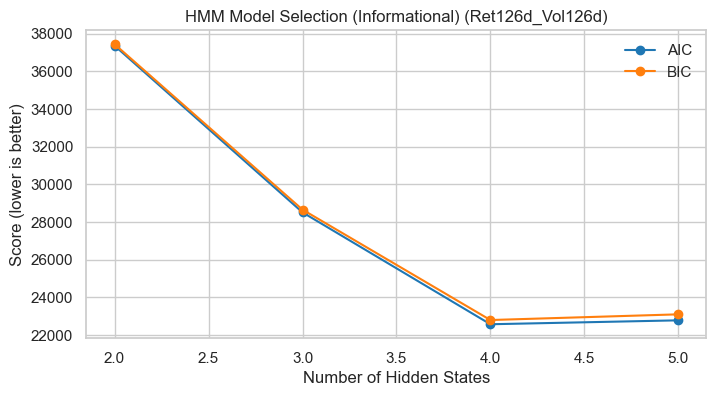

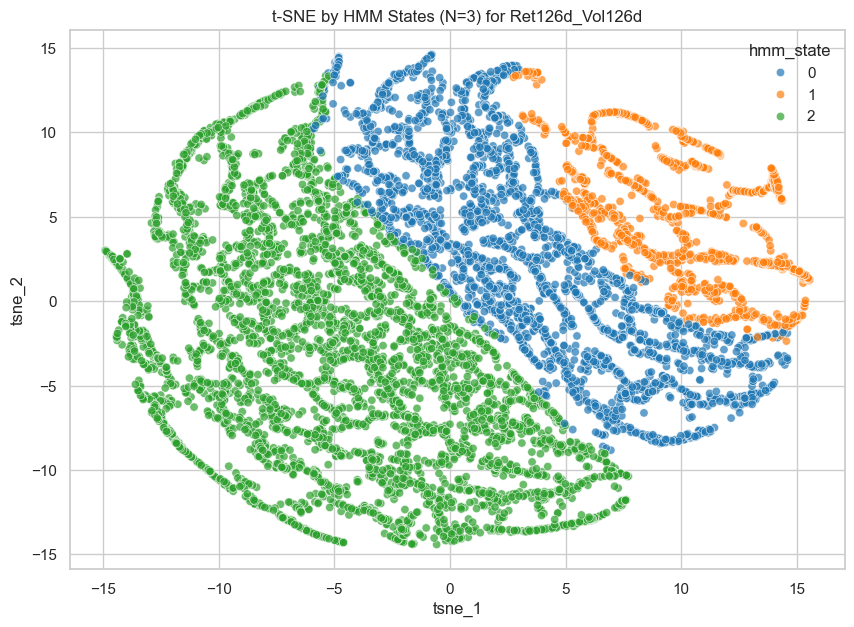

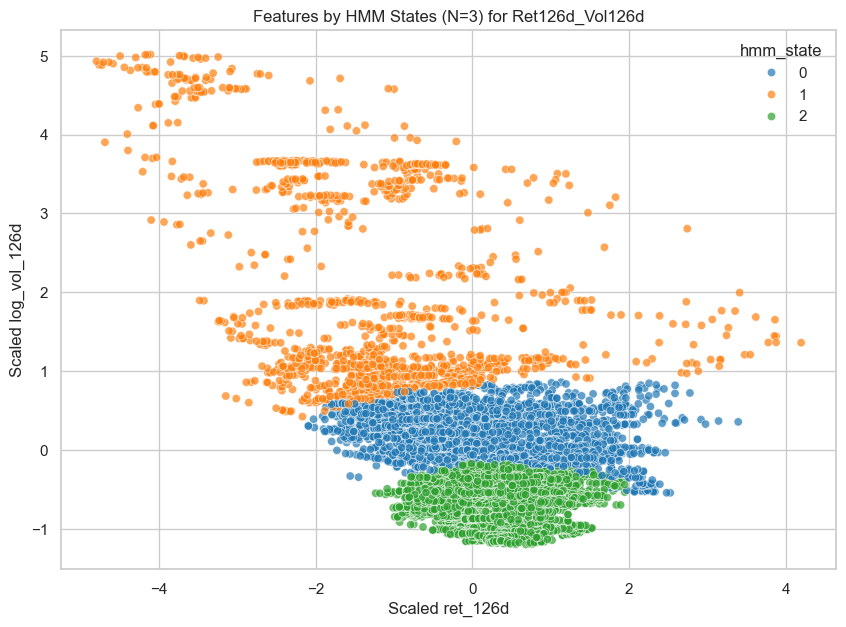

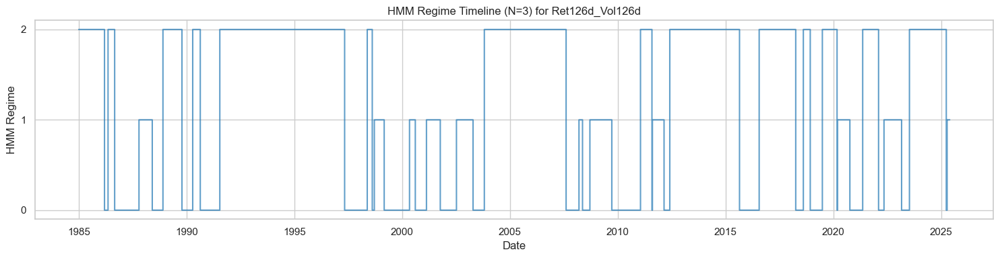

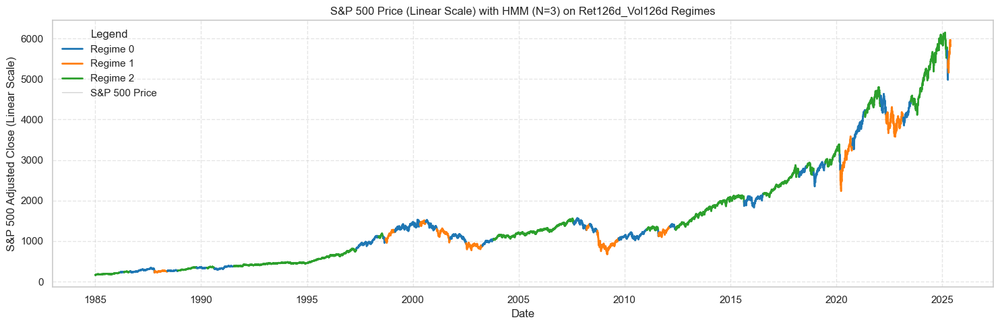

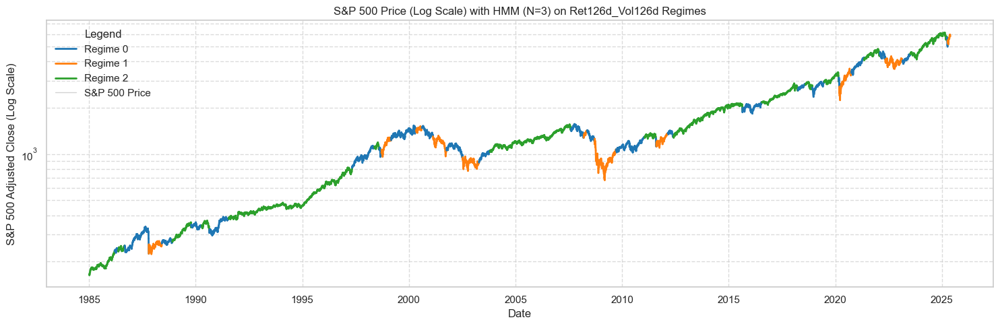

2025-05-27 16:11:40,951 - INFO - 
HMM Transition Matrix for Ret126d_Vol126d:
2025-05-27 16:11:40,961 - INFO - 
Comprehensive HMM State Characteristics & S&P 500 Performance for Ret126d_Vol126d:
2025-05-27 16:11:40,964 - INFO - 
Analyzing Feature Pair: Ret126d_Vol63d - ['ret_126d', 'log_vol_63d']
2025-05-27 16:11:40,970 - INFO - Shape of feature data for Ret126d_Vol63d after dropna: (10178, 2)
2025-05-27 16:11:40,974 - INFO - Scaled features head for Ret126d_Vol63d:
2025-05-27 16:11:40,980 - INFO - 
--- t-SNE for Ret126d_Vol63d ---


              To State 0  To State 1  To State 2
From State 0      0.9926      0.0034      0.0040
From State 1      0.0067      0.9933      0.0000
From State 2      0.0026      0.0000      0.9974
 HMM State  Mean Original ret_126d  Std Original ret_126d  Mean Original log_vol_126d  Std Original log_vol_126d  Mean Scaled ret_126d  Variance Scaled ret_126d  Mean Scaled log_vol_126d  Variance Scaled log_vol_126d  hmm_state     count  mean_daily_return  std_daily_return  annualized_return  annualized_volatility
         0                  0.0625                 0.1084                      0.1772                     0.0234                0.1057                    1.0173                    0.1837                        0.0799     0.0000 3271.0000             0.0003            0.0115             0.0855                 0.1828
         1                 -0.0770                 0.1460                      0.3153                     0.1027               -1.1928                    1.8458          

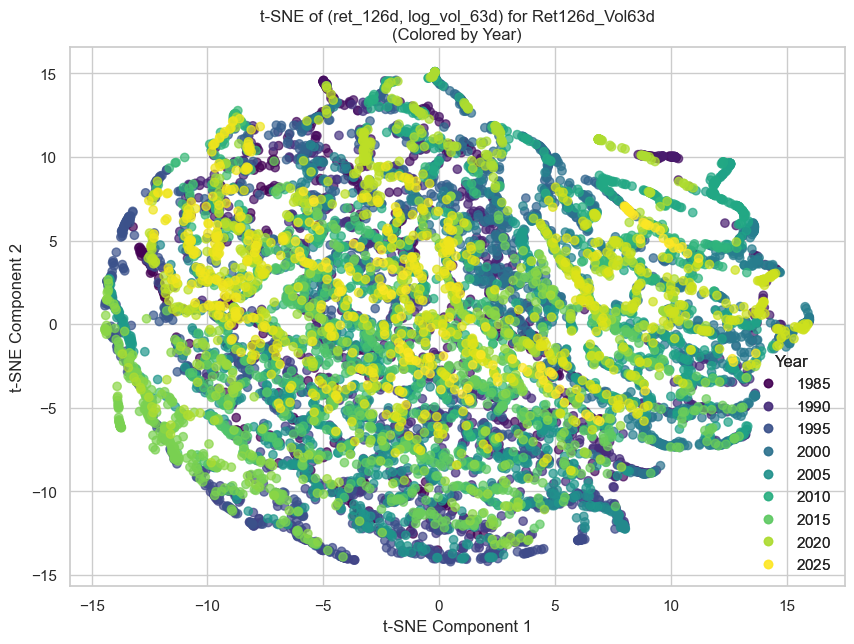

2025-05-27 16:11:52,057 - INFO - 
--- K-Means Clustering for Ret126d_Vol63d ---
2025-05-27 16:11:52,058 - INFO - Forcing K = 3 for K-Means (Ret126d_Vol63d).


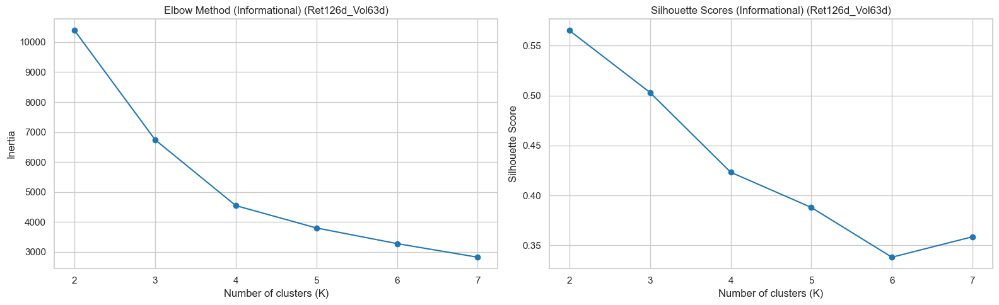

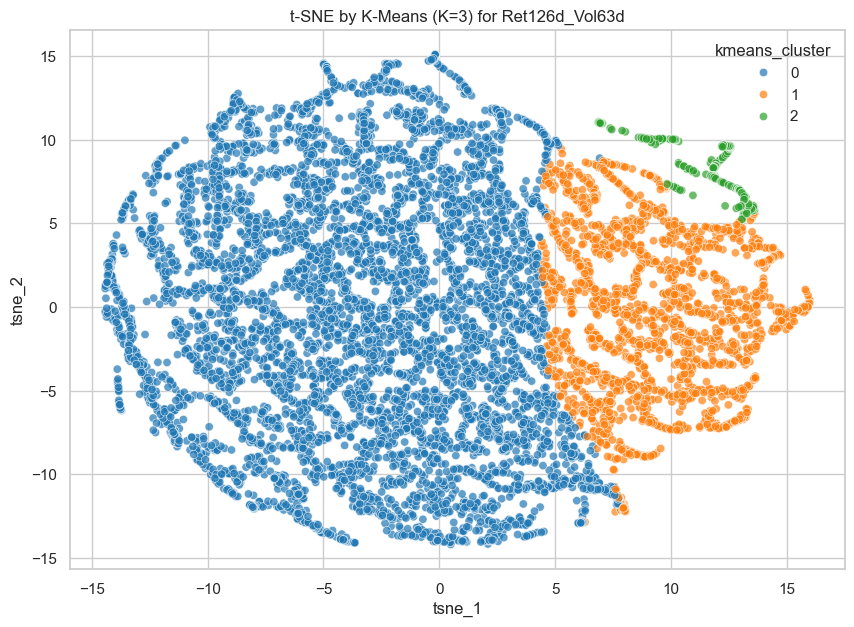

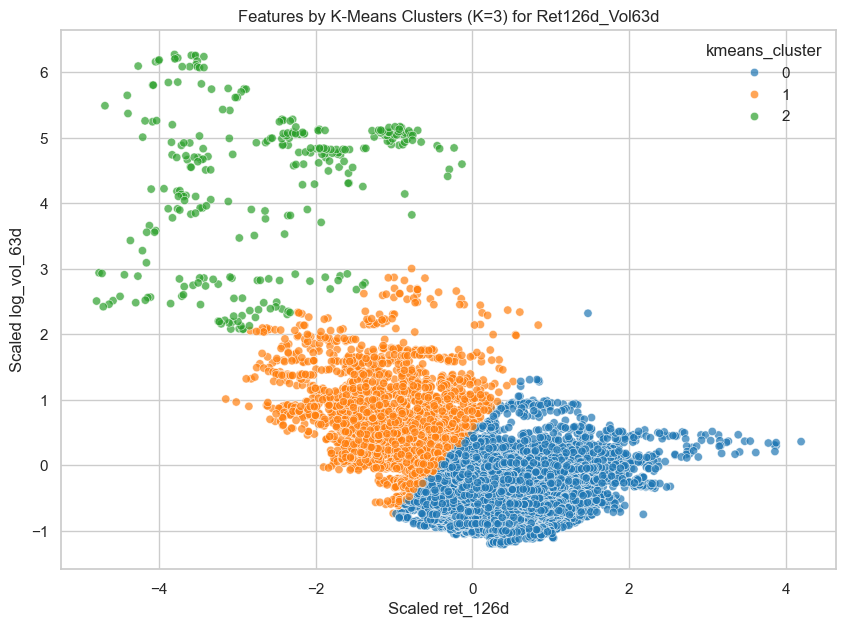

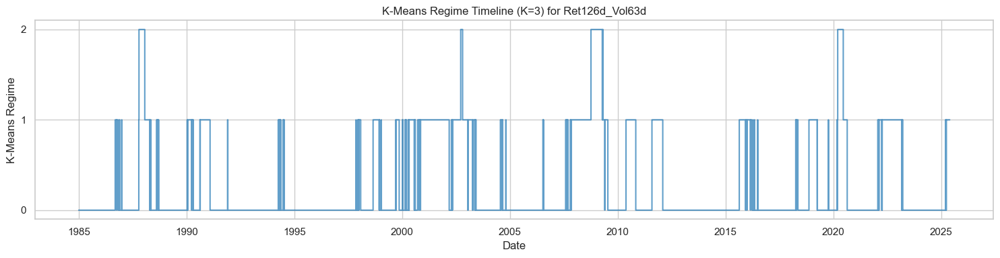

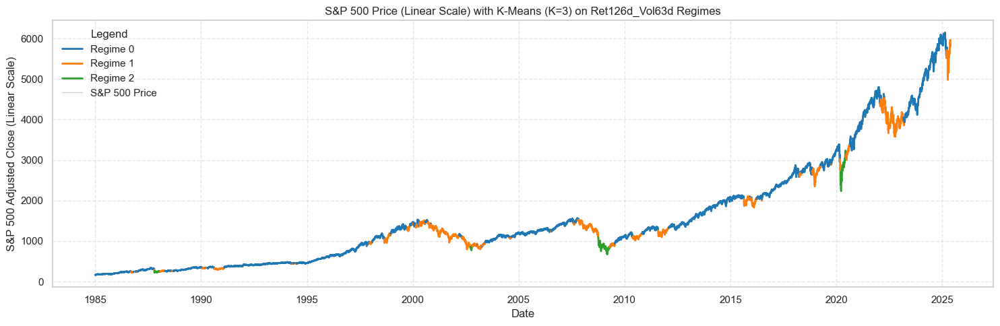

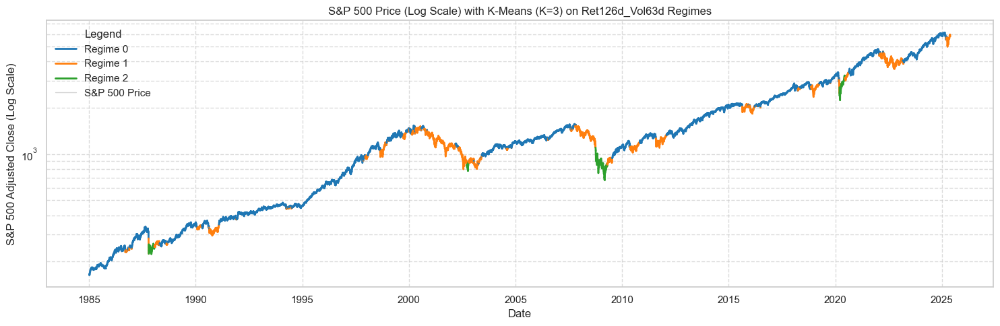

2025-05-27 16:12:31,990 - INFO - 
K-Means Feature Characteristics for Ret126d_Vol63d (Original Scale):
                ret_126d           log_vol_63d          
                    mean       std        mean       std
kmeans_cluster                                          
0               0.096875  0.069009    0.122949  0.034530
1              -0.057926  0.065256    0.222600  0.055270
2              -0.233880  0.119606    0.544272  0.103902
2025-05-27 16:12:31,992 - INFO - 
S&P 500 Performance per K-Means Regime for Ret126d_Vol63d:
   kmeans_cluster  count  mean_daily_return  std_daily_return  \
0               0   7501           0.000702          0.008117   
1               1   2387          -0.000430          0.014724   
2               2    289          -0.000008          0.033994   

   annualized_return  annualized_volatility  
0           0.176909               0.128857  
1          -0.108446               0.233729  
2          -0.001994               0.539638  
2025-05-27 16:12:

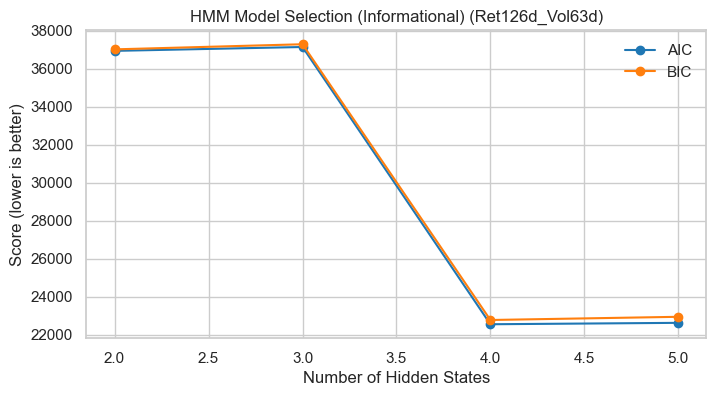

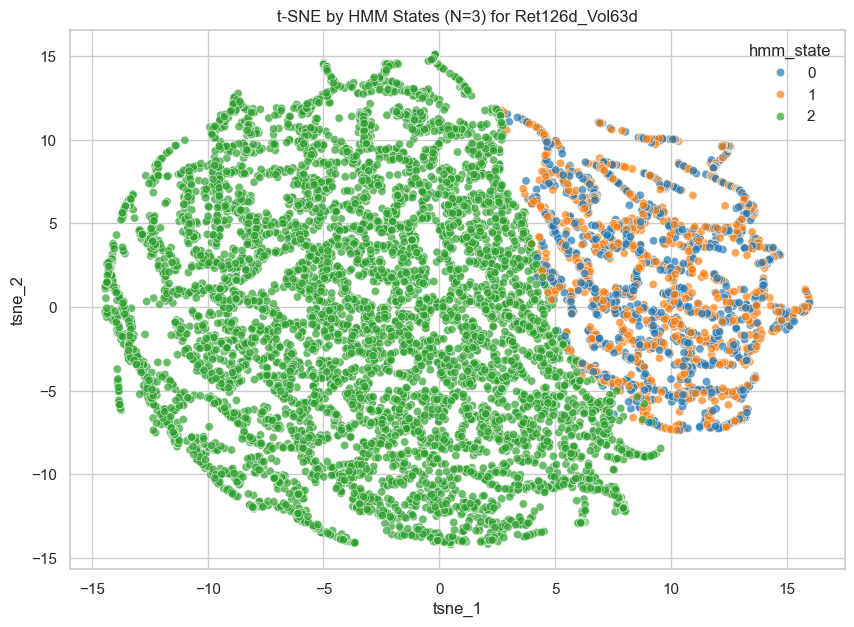

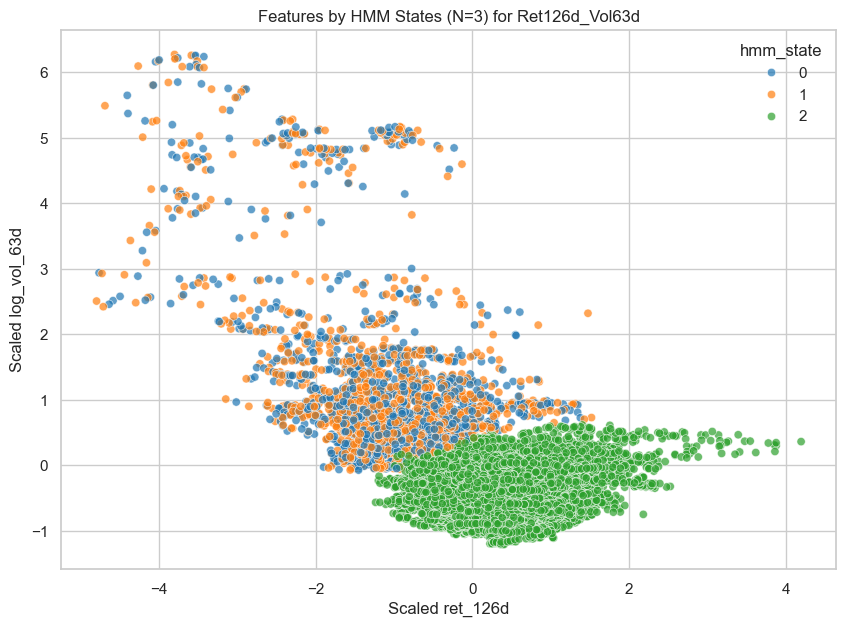

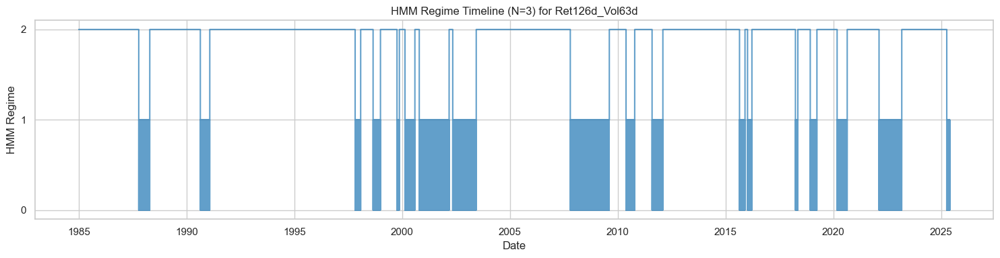

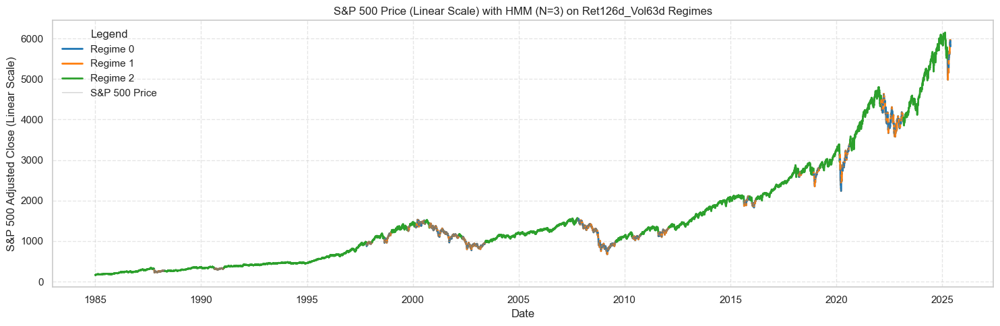

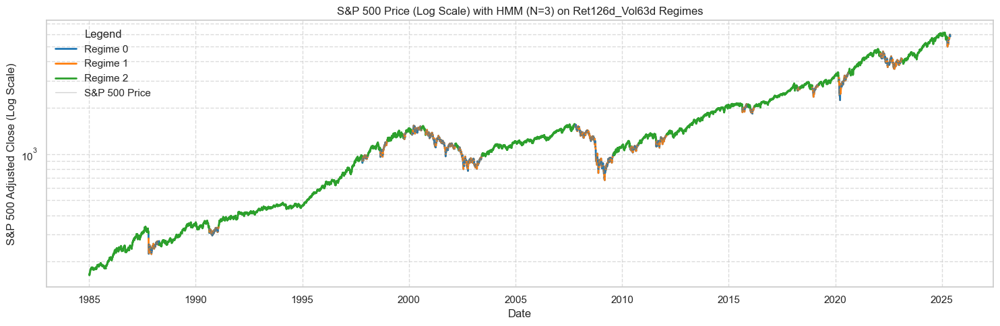

2025-05-27 16:12:59,677 - INFO - 
HMM Transition Matrix for Ret126d_Vol63d:
2025-05-27 16:12:59,685 - INFO - 
Comprehensive HMM State Characteristics & S&P 500 Performance for Ret126d_Vol63d:
2025-05-27 16:12:59,688 - INFO - 
Analyzing Feature Pair: Ret126d_Vol21d - ['ret_126d', 'log_vol_21d']
2025-05-27 16:12:59,691 - INFO - Shape of feature data for Ret126d_Vol21d after dropna: (10178, 2)
2025-05-27 16:12:59,694 - INFO - Scaled features head for Ret126d_Vol21d:
2025-05-27 16:12:59,697 - INFO - 
--- t-SNE for Ret126d_Vol21d ---


              To State 0  To State 1  To State 2
From State 0      0.0113      0.9873      0.0014
From State 1      0.7525      0.2365      0.0110
From State 2      0.0023      0.0000      0.9976
 HMM State  Mean Original ret_126d  Std Original ret_126d  Mean Original log_vol_63d  Std Original log_vol_63d  Mean Scaled ret_126d  Variance Scaled ret_126d  Mean Scaled log_vol_63d  Variance Scaled log_vol_63d  hmm_state     count  mean_daily_return  std_daily_return  annualized_return  annualized_volatility
         0                 -0.0728                 0.1020                     0.2682                    0.1147               -1.1538                    0.9014                   1.2271                       1.6403     0.0000 1236.0000             0.0001            0.0189             0.0202                 0.2995
         1                 -0.0732                 0.1027                     0.2691                    0.1153               -1.1576                    0.9126                   1

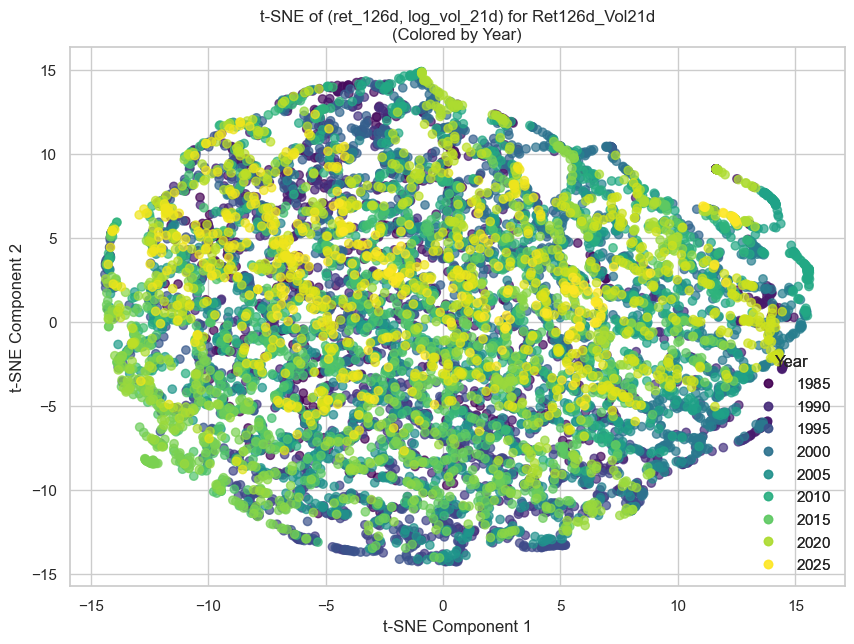

2025-05-27 16:13:09,878 - INFO - 
--- K-Means Clustering for Ret126d_Vol21d ---
2025-05-27 16:13:09,879 - INFO - Forcing K = 3 for K-Means (Ret126d_Vol21d).


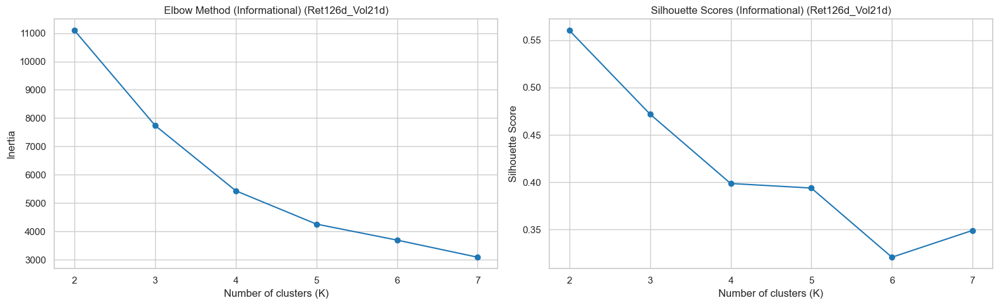

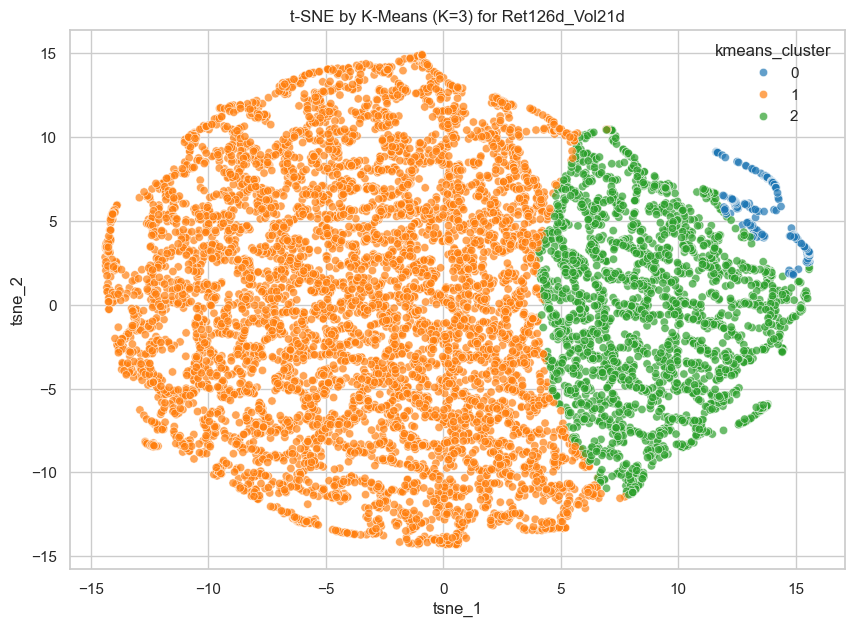

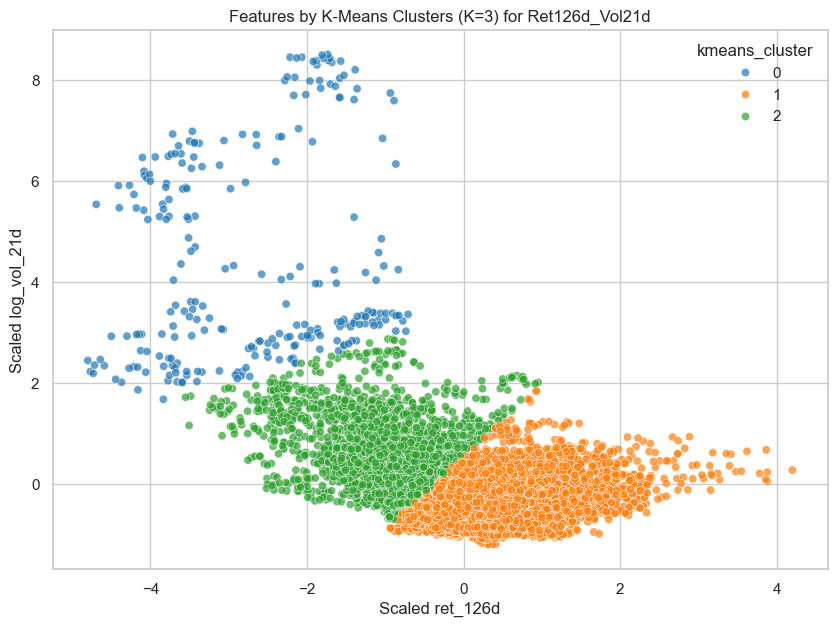

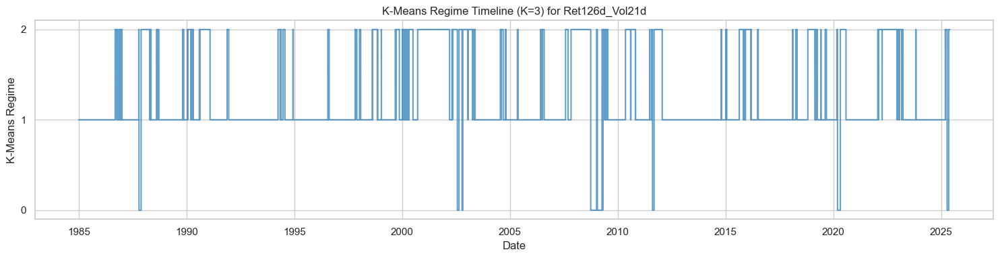

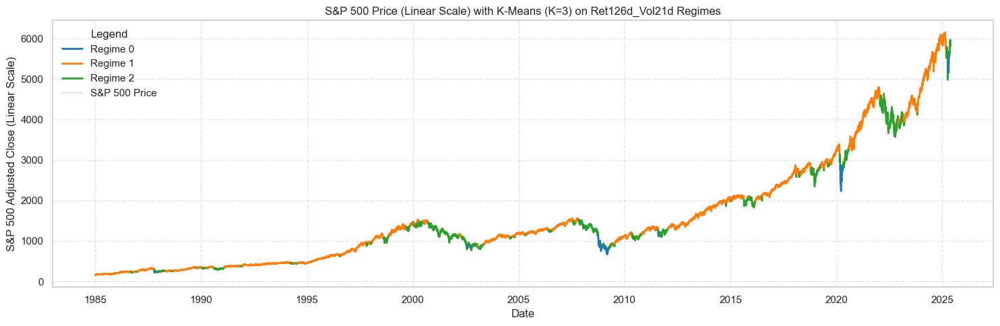

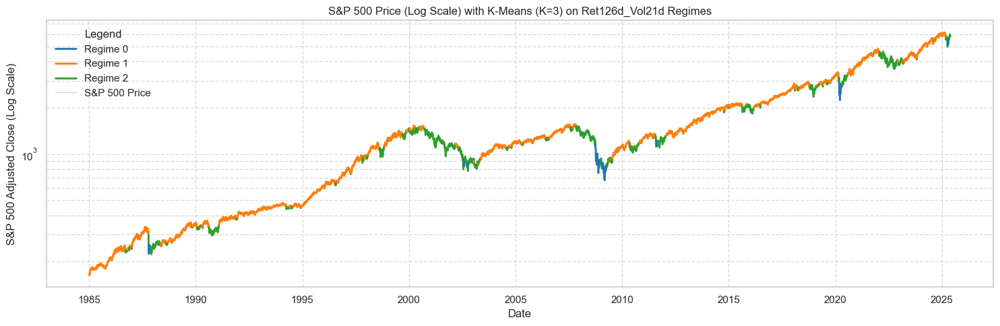

2025-05-27 16:13:50,640 - INFO - 
K-Means Feature Characteristics for Ret126d_Vol21d (Original Scale):
                ret_126d           log_vol_21d          
                    mean       std        mean       std
kmeans_cluster                                          
0              -0.236871  0.119457    0.580294  0.198169
1               0.098108  0.068383    0.115848  0.039555
2              -0.057716  0.070236    0.213324  0.064747
2025-05-27 16:13:50,643 - INFO - 
S&P 500 Performance per K-Means Regime for Ret126d_Vol21d:
   kmeans_cluster  count  mean_daily_return  std_daily_return  \
0               0    249           0.000509          0.037795   
1               1   7398           0.000709          0.007859   
2               2   2530          -0.000448          0.014517   

   annualized_return  annualized_volatility  
0           0.128239               0.599974  
1           0.178587               0.124754  
2          -0.112868               0.230453  
2025-05-27 16:13:

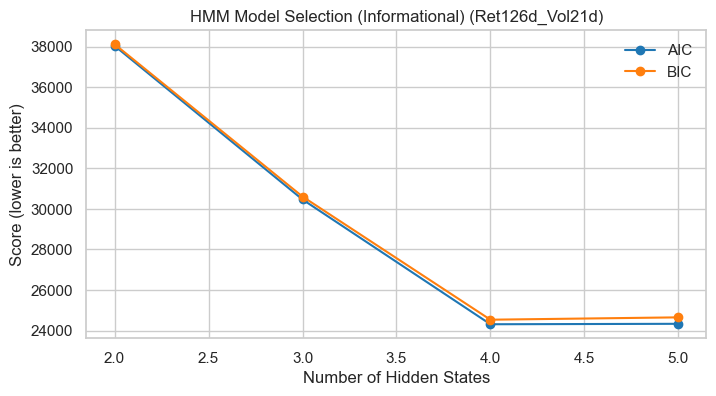

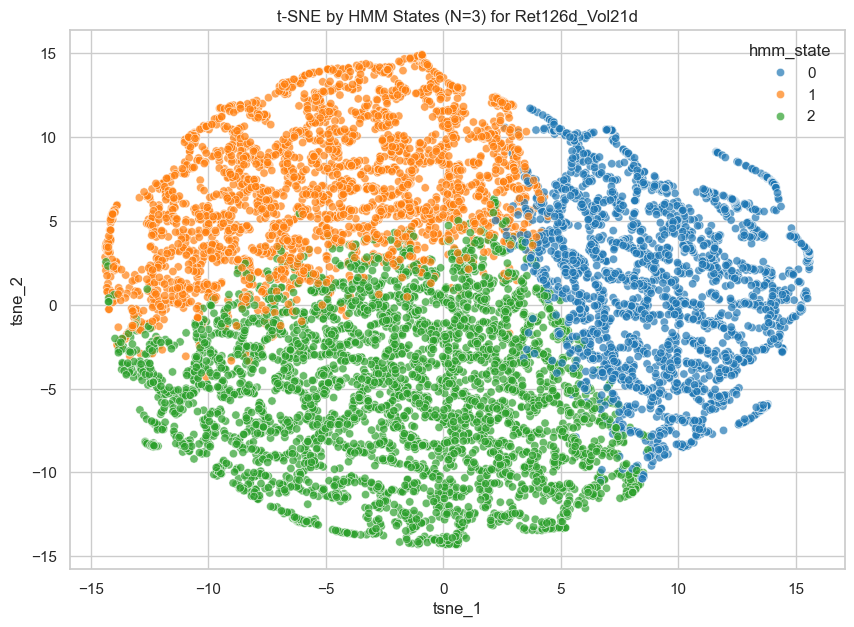

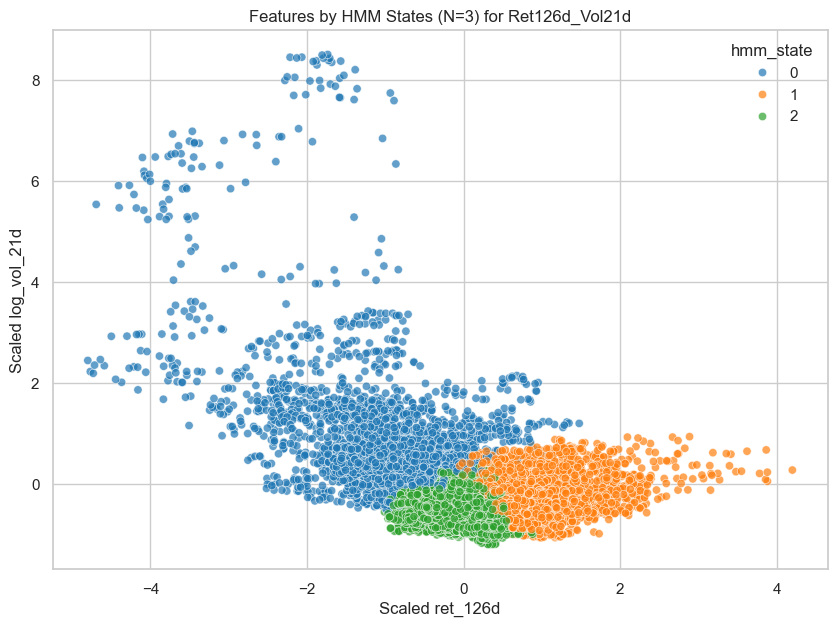

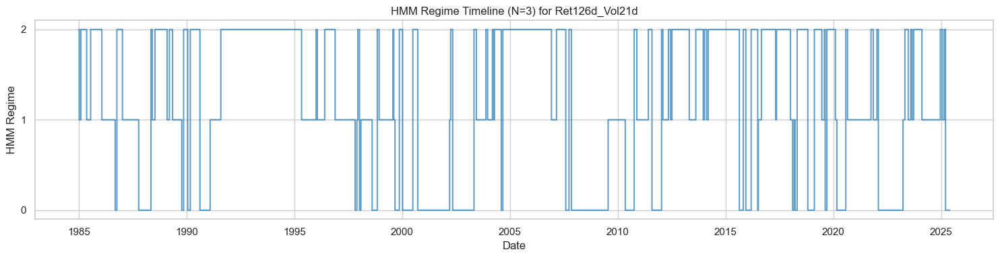

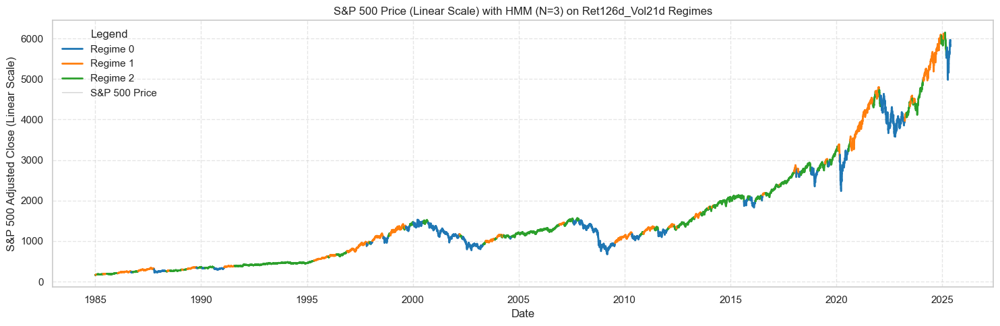

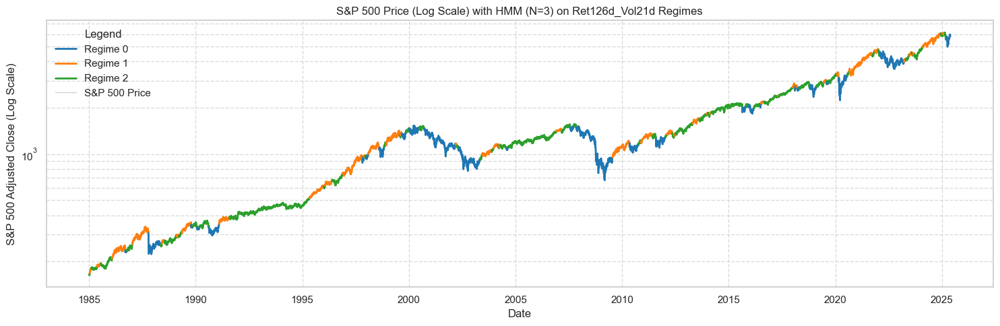

2025-05-27 16:14:20,827 - INFO - 
HMM Transition Matrix for Ret126d_Vol21d:
2025-05-27 16:14:20,836 - INFO - 
Comprehensive HMM State Characteristics & S&P 500 Performance for Ret126d_Vol21d:
2025-05-27 16:14:20,842 - INFO - 
Analyzing Feature Pair: Ret126d_Vol5d - ['ret_126d', 'log_vol_5d']
2025-05-27 16:14:20,845 - INFO - Shape of feature data for Ret126d_Vol5d after dropna: (10178, 2)
2025-05-27 16:14:20,849 - INFO - Scaled features head for Ret126d_Vol5d:
2025-05-27 16:14:20,851 - INFO - 
--- t-SNE for Ret126d_Vol5d ---


              To State 0  To State 1  To State 2
From State 0      0.9896      0.0031      0.0073
From State 1      0.0032      0.9849      0.0119
From State 2      0.0041      0.0084      0.9875
 HMM State  Mean Original ret_126d  Std Original ret_126d  Mean Original log_vol_21d  Std Original log_vol_21d  Mean Scaled ret_126d  Variance Scaled ret_126d  Mean Scaled log_vol_21d  Variance Scaled log_vol_21d  hmm_state     count  mean_daily_return  std_daily_return  annualized_return  annualized_volatility
         0                 -0.0708                 0.1009                     0.2585                    0.1335               -1.1348                    0.8819                   1.0976                       1.8757     0.0000 2617.0000            -0.0002            0.0184            -0.0447                 0.2923
         1                  0.1597                 0.0567                     0.1299                    0.0397                1.0102                    0.2782                  -0

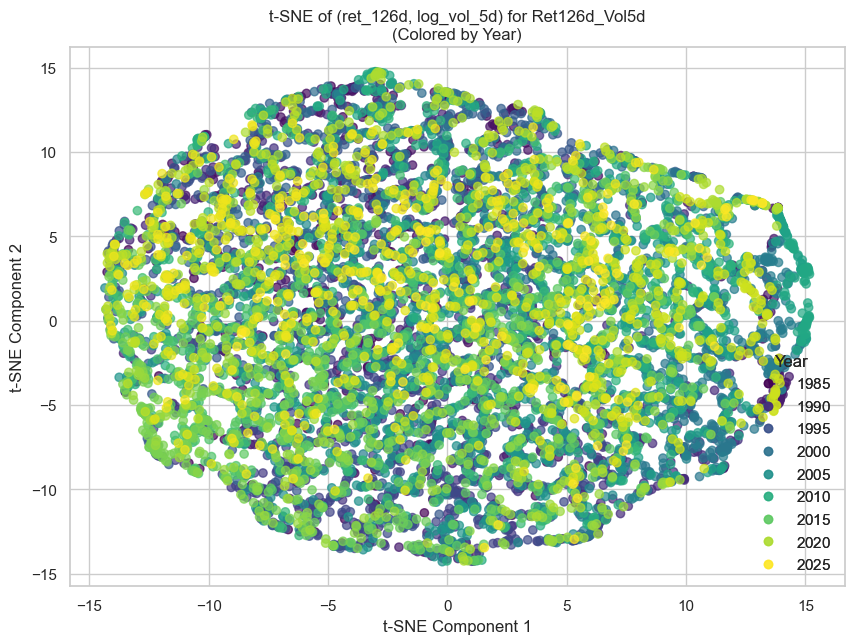

2025-05-27 16:14:31,878 - INFO - 
--- K-Means Clustering for Ret126d_Vol5d ---
2025-05-27 16:14:31,878 - INFO - Forcing K = 3 for K-Means (Ret126d_Vol5d).


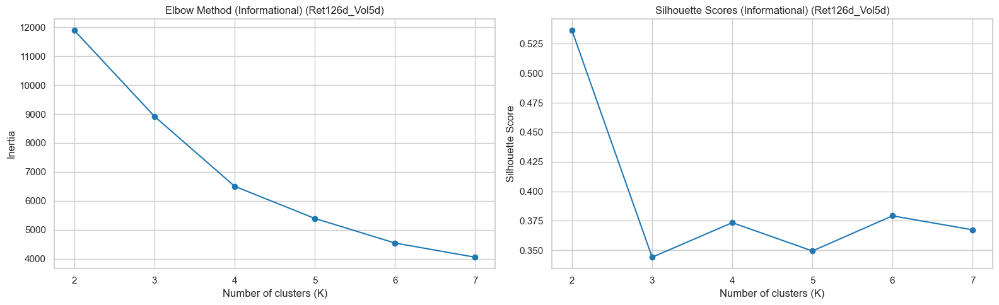

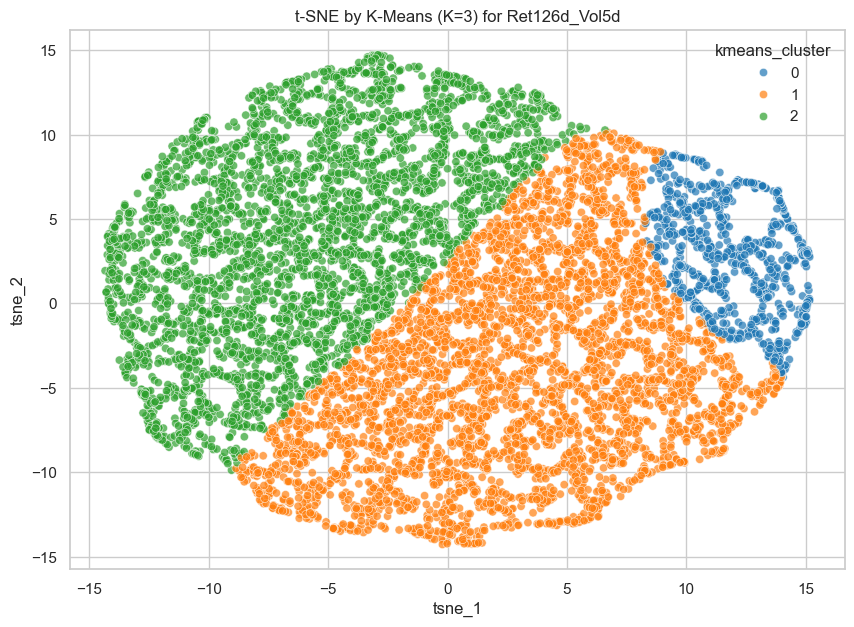

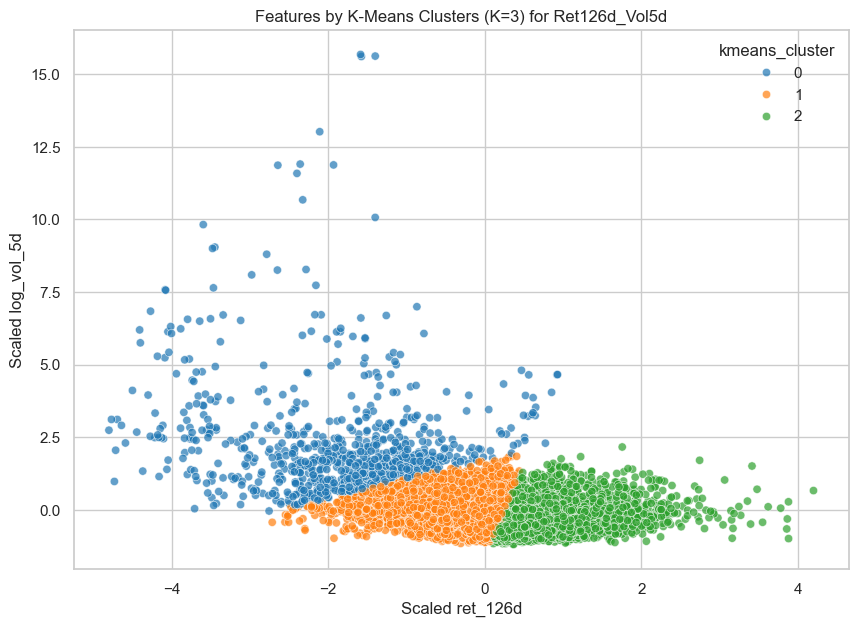

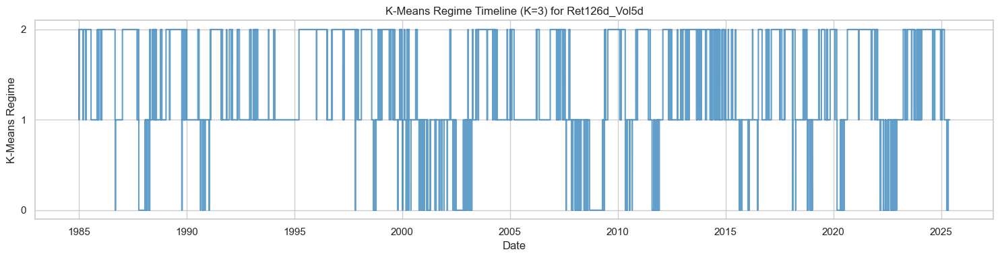

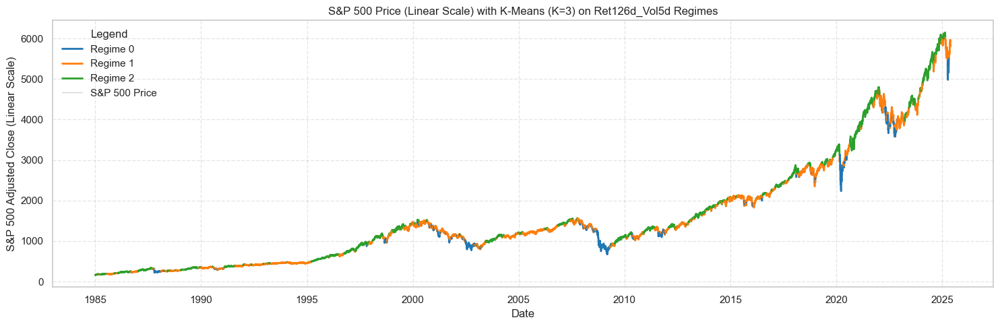

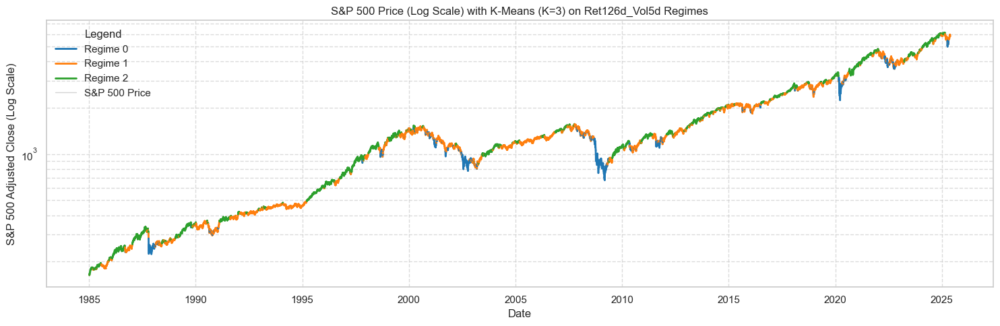

2025-05-27 16:15:09,534 - INFO - 
K-Means Feature Characteristics for Ret126d_Vol5d (Original Scale):
                ret_126d           log_vol_5d          
                    mean       std       mean       std
kmeans_cluster                                         
0              -0.145030  0.109660   0.349658  0.191768
1               0.009523  0.053150   0.119259  0.055739
2               0.140833  0.056536   0.098115  0.048665
2025-05-27 16:15:09,537 - INFO - 
S&P 500 Performance per K-Means Regime for Ret126d_Vol5d:
   kmeans_cluster  count  mean_daily_return  std_daily_return  \
0               0    922          -0.000170          0.026815   
1               1   4942          -0.000055          0.009293   
2               2   4313           0.001082          0.007680   

   annualized_return  annualized_volatility  
0          -0.042915               0.425677  
1          -0.013835               0.147517  
2           0.272548               0.121920  
2025-05-27 16:15:09,538 -

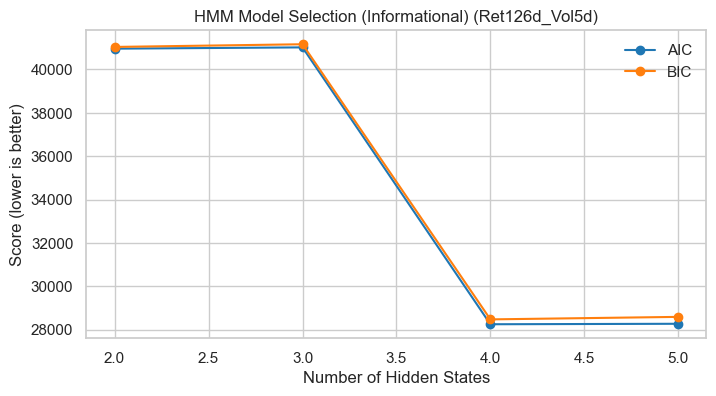

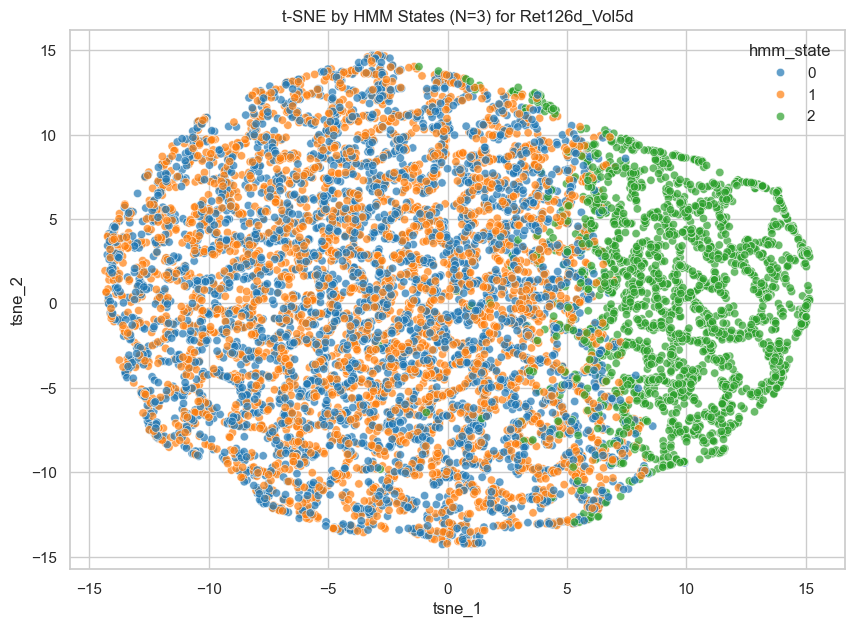

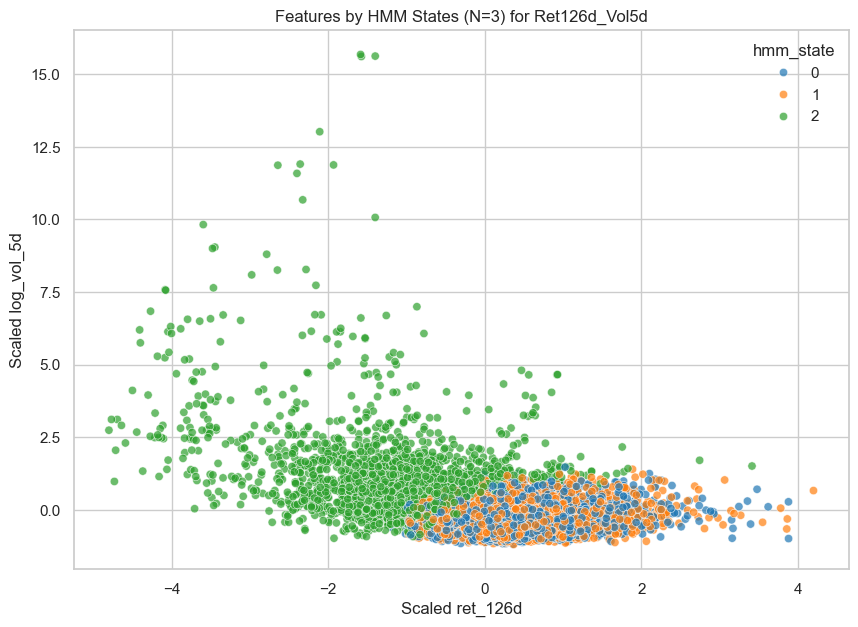

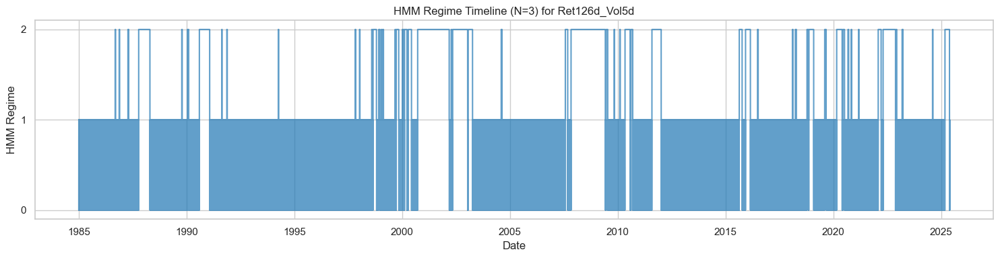

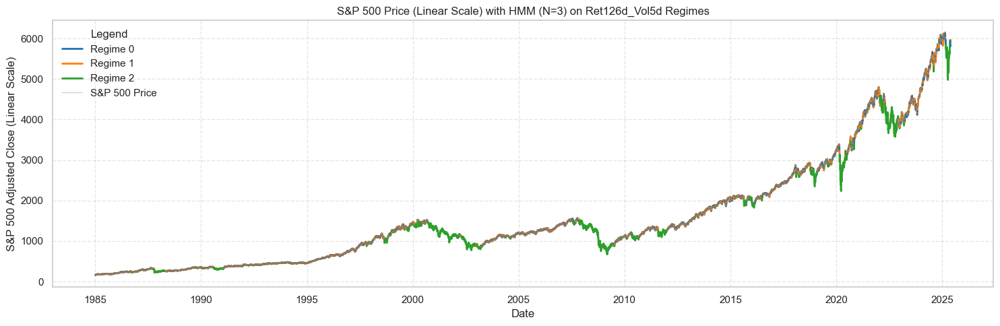

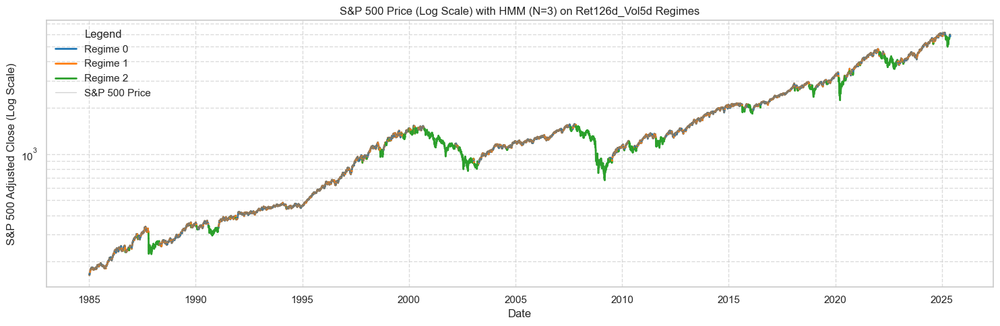

2025-05-27 16:15:43,078 - INFO - 
HMM Transition Matrix for Ret126d_Vol5d:
2025-05-27 16:15:43,087 - INFO - 
Comprehensive HMM State Characteristics & S&P 500 Performance for Ret126d_Vol5d:
2025-05-27 16:15:43,090 - INFO - 
Analyzing Feature Pair: Ret126d_Vol1d - ['ret_126d', 'log_vol_1d']
2025-05-27 16:15:43,094 - INFO - Shape of feature data for Ret126d_Vol1d after dropna: (10178, 2)
2025-05-27 16:15:43,097 - INFO - Scaled features head for Ret126d_Vol1d:
2025-05-27 16:15:43,099 - INFO - 
--- t-SNE for Ret126d_Vol1d ---


              To State 0  To State 1  To State 2
From State 0      0.0021      0.9979      0.0000
From State 1      0.9747      0.0092      0.0161
From State 2      0.0102      0.0177      0.9721
 HMM State  Mean Original ret_126d  Std Original ret_126d  Mean Original log_vol_5d  Std Original log_vol_5d  Mean Scaled ret_126d  Variance Scaled ret_126d  Mean Scaled log_vol_5d  Variance Scaled log_vol_5d  hmm_state     count  mean_daily_return  std_daily_return  annualized_return  annualized_volatility
         0                  0.0896                 0.0723                    0.0978                   0.0444                0.3576                    0.4522                 -0.3222                      0.1845     0.0000 3917.0000             0.0006            0.0076             0.1638                 0.1200
         1                  0.0892                 0.0724                    0.0986                   0.0449                0.3540                    0.4544                 -0.3150      

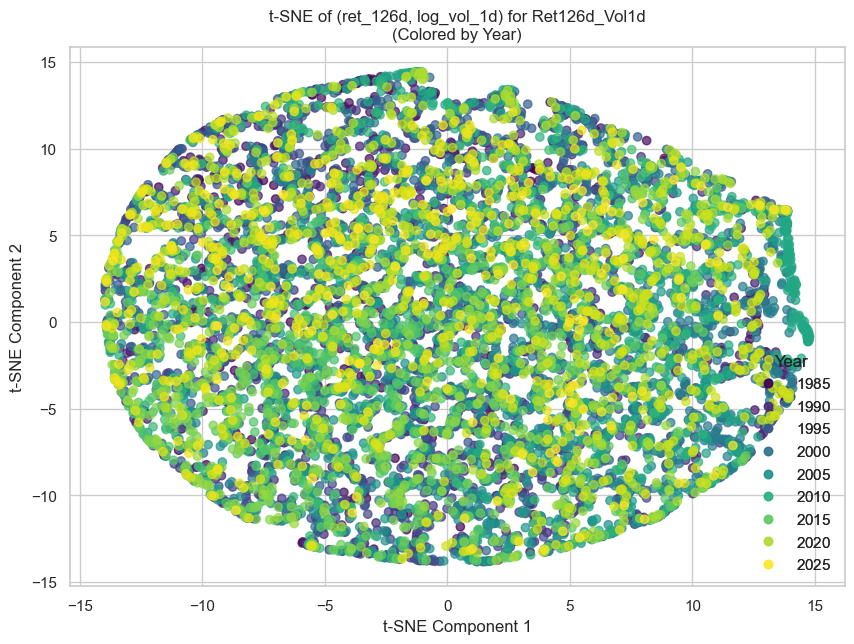

2025-05-27 16:15:54,172 - INFO - 
--- K-Means Clustering for Ret126d_Vol1d ---
2025-05-27 16:15:54,173 - INFO - Forcing K = 3 for K-Means (Ret126d_Vol1d).


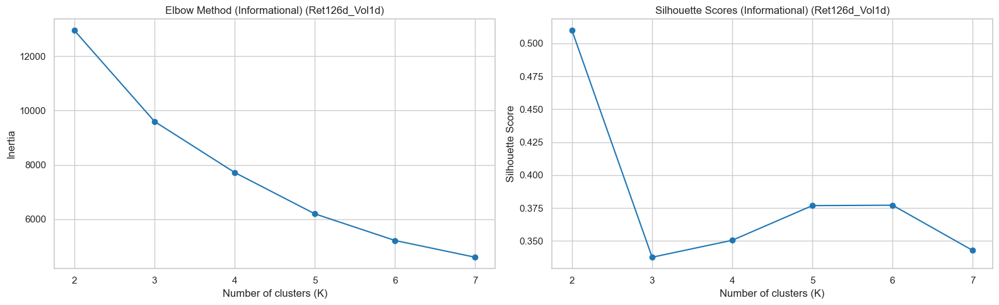

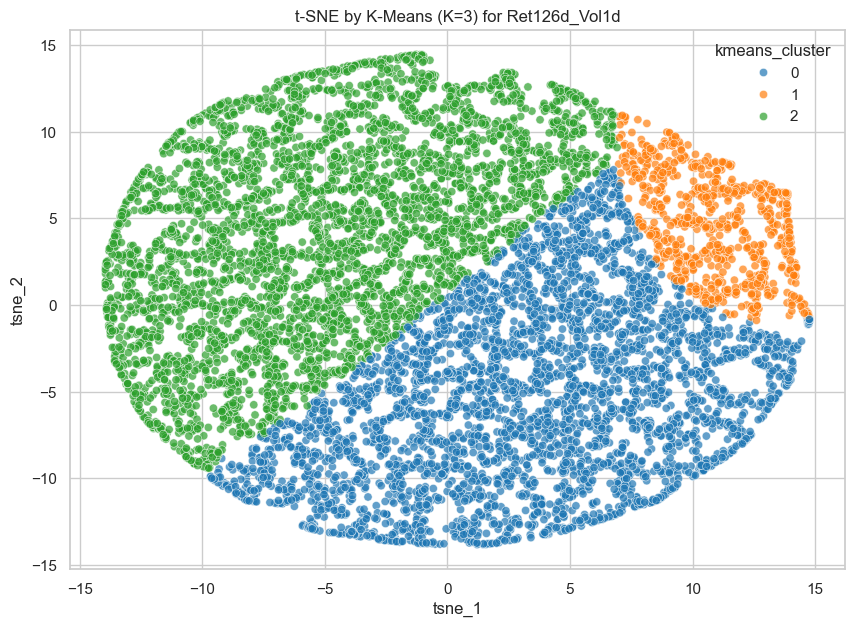

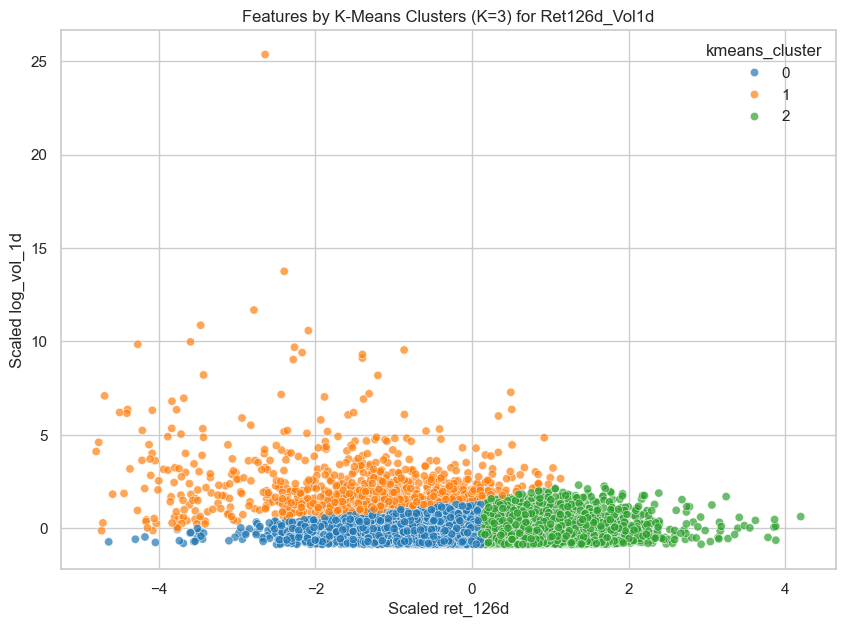

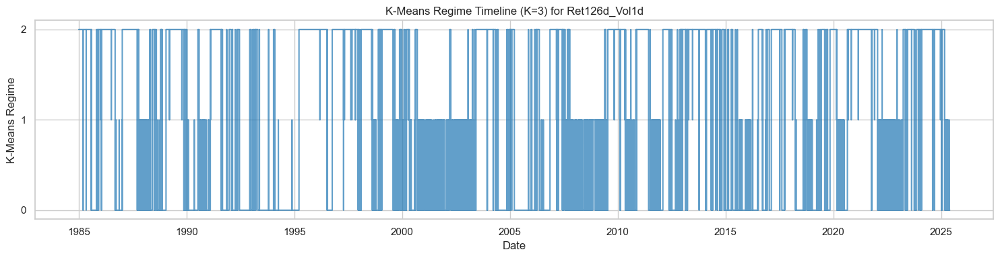

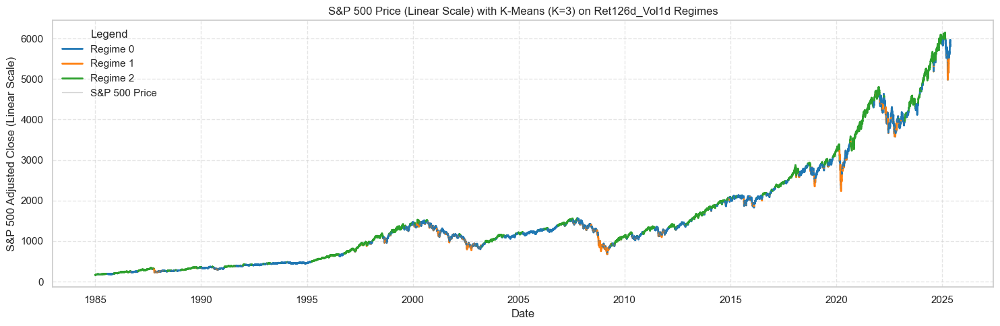

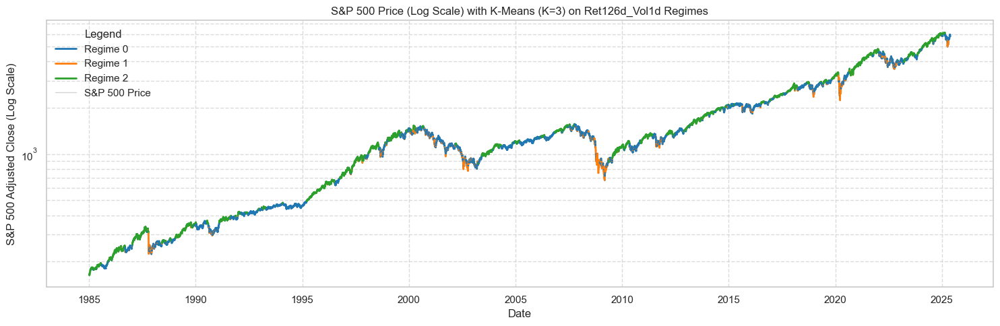

2025-05-27 16:16:32,554 - INFO - 
K-Means Feature Characteristics for Ret126d_Vol1d (Original Scale):
                ret_126d           log_vol_1d          
                    mean       std       mean       std
kmeans_cluster                                         
0              -0.006293  0.064741   0.092207  0.071796
1              -0.108848  0.126030   0.436494  0.245873
2               0.133928  0.057547   0.091826  0.079115
2025-05-27 16:16:32,556 - INFO - 
S&P 500 Performance per K-Means Regime for Ret126d_Vol1d:
   kmeans_cluster  count  mean_daily_return  std_daily_return  \
0               0   4552           0.000245          0.007359   
1               1    840          -0.002852          0.031172   
2               2   4785           0.001153          0.007556   

   annualized_return  annualized_volatility  
0           0.061778               0.116828  
1          -0.718582               0.494838  
2           0.290482               0.119954  
2025-05-27 16:16:32,556 -

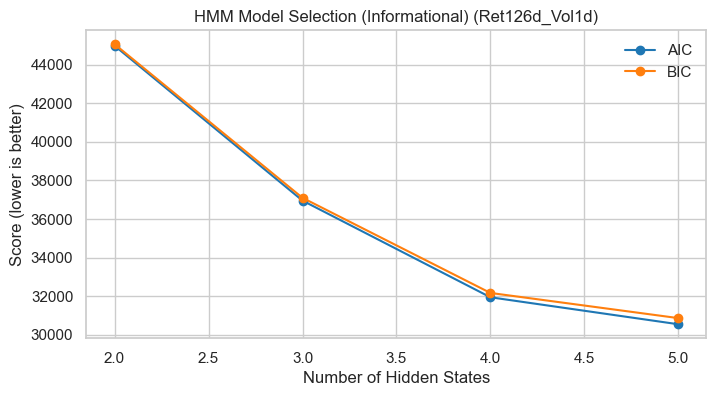

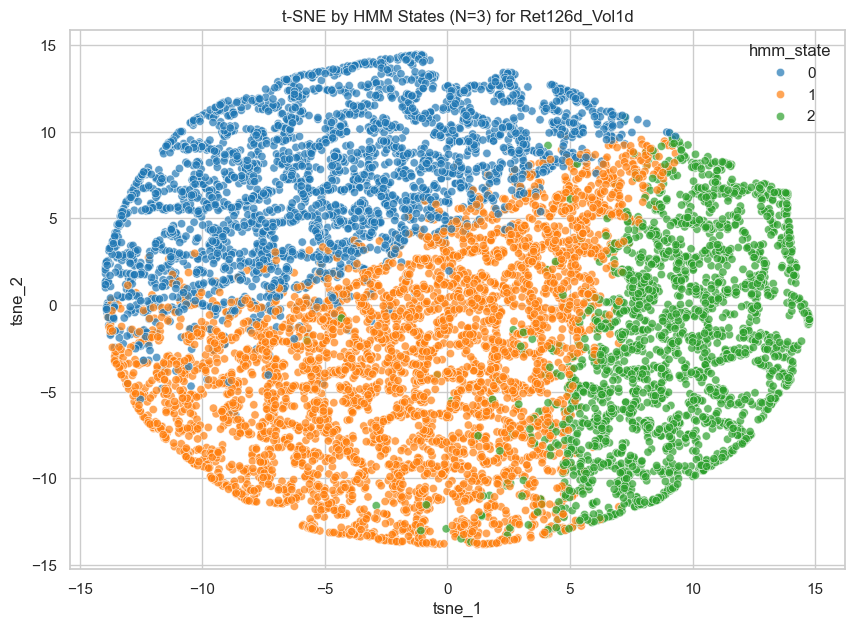

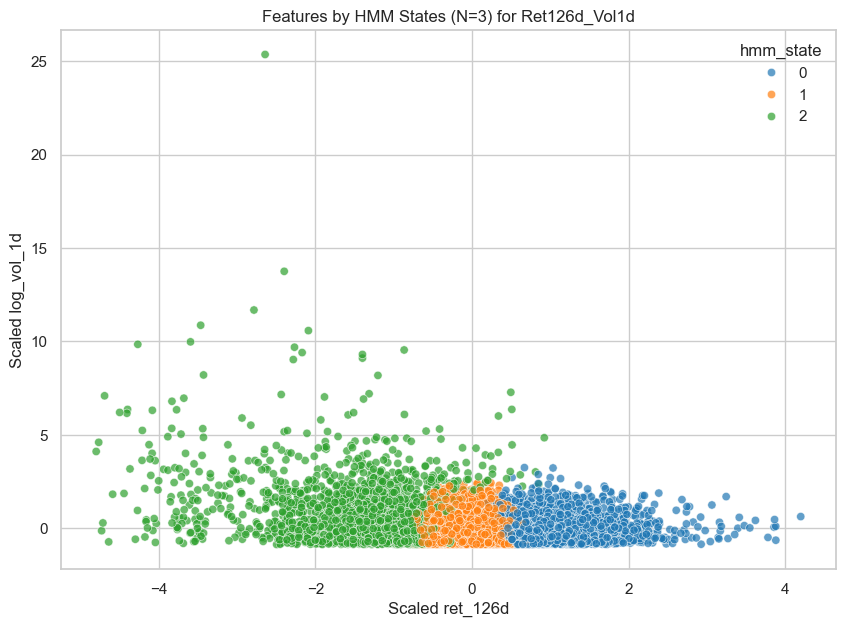

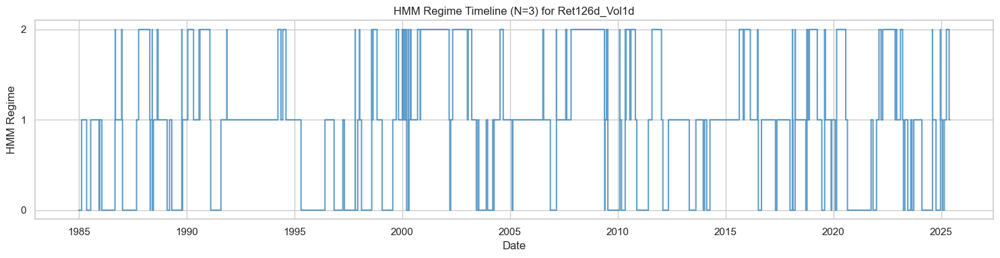

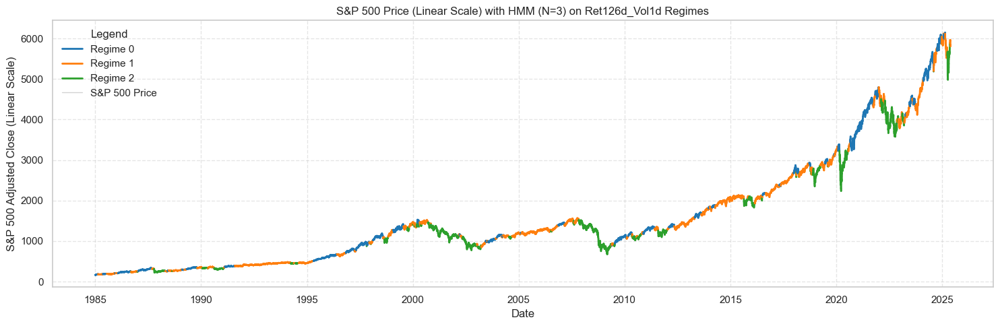

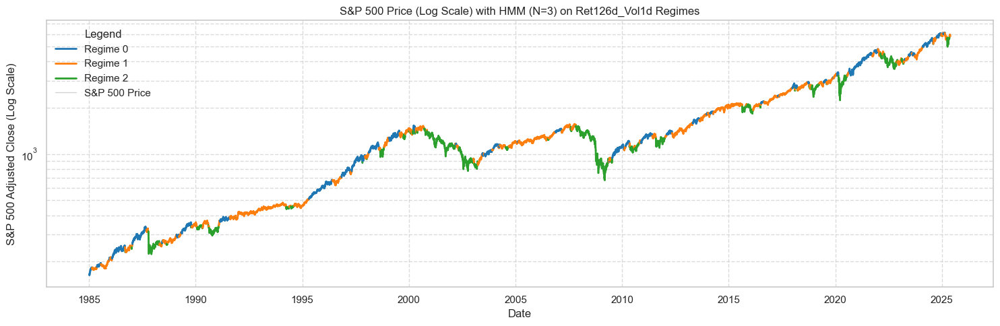

2025-05-27 16:17:03,864 - INFO - 
HMM Transition Matrix for Ret126d_Vol1d:
2025-05-27 16:17:03,873 - INFO - 
Comprehensive HMM State Characteristics & S&P 500 Performance for Ret126d_Vol1d:
2025-05-27 16:17:03,890 - INFO - 
Finished analysis for all feature pairs.


              To State 0  To State 1  To State 2
From State 0      0.9815      0.0145      0.0040
From State 1      0.0106      0.9785      0.0109
From State 2      0.0023      0.0248      0.9728
 HMM State  Mean Original ret_126d  Std Original ret_126d  Mean Original log_vol_1d  Std Original log_vol_1d  Mean Scaled ret_126d  Variance Scaled ret_126d  Mean Scaled log_vol_1d  Variance Scaled log_vol_1d  hmm_state     count  mean_daily_return  std_daily_return  annualized_return  annualized_volatility
         0                  0.1621                 0.0536                    0.1000                   0.0870                1.0318                    0.2488                 -0.1473                      0.3942     0.0000 3036.0000             0.0010            0.0083             0.2413                 0.1322
         1                  0.0503                 0.0322                    0.0891                   0.0791               -0.0084                    0.0900                 -0.2261      

In [16]:
for pair_name, current_feature_tuple in FEATURE_PAIRS.items():
    selected_features = list(current_feature_tuple)
    logger.info(f"\n{'='*80}\nAnalyzing Feature Pair: {pair_name} - {selected_features}\n{'='*80}")

    features_df_raw = data_df_full[selected_features].copy()
    features_df_raw.dropna(inplace=True)
    logger.info(f"Shape of feature data for {pair_name} after dropna: {features_df_raw.shape}")

    if features_df_raw.empty or len(features_df_raw) < 50: 
        logger.warning(f"Skipping pair {pair_name} due to insufficient data after NaN removal (rows: {len(features_df_raw)}).")
        kmeans_results_all_pairs[pair_name] = {'labels': None, 'feature_summary': None, 'performance_summary': None, 'model': None}
        hmm_results_all_pairs[pair_name] = {'states': None, 'feature_summary': None, 'performance_summary': None, 'model': None}
        continue

    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features_df_raw)
    features_scaled_df = pd.DataFrame(features_scaled, columns=selected_features, index=features_df_raw.index)
    
    logger.info(f"Scaled features head for {pair_name}:")
    print(features_scaled_df.head())

    logger.info(f"\n--- t-SNE for {pair_name} ---")
    perplexity_value = min(30, len(features_scaled_df) - 1) 
    tsne_df = pd.DataFrame() 
    if perplexity_value >= 5: 
        tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity_value, n_iter=300, learning_rate='auto', init='pca')
        tsne_results = tsne.fit_transform(features_scaled_df)
        tsne_df = pd.DataFrame(data=tsne_results, columns=['tsne_1', 'tsne_2'], index=features_scaled_df.index)
        
        plt.figure(figsize=(10, 7))
        scatter = plt.scatter(tsne_df['tsne_1'], tsne_df['tsne_2'], 
                              c=tsne_df.index.year, cmap='viridis', alpha=0.7)
        plt.title(f't-SNE of ({selected_features[0]}, {selected_features[1]}) for {pair_name}\n(Colored by Year)')
        plt.xlabel('t-SNE Component 1')
        plt.ylabel('t-SNE Component 2')
        unique_years = sorted(tsne_df.index.year.unique())
        if len(unique_years) > 0:
            num_legend_items = min(10, len(unique_years))
            legend1 = plt.legend(*scatter.legend_elements(num=num_legend_items), title="Year")
            plt.gca().add_artist(legend1)
        plt.show()
    else:
        logger.warning(f"Skipping t-SNE for {pair_name} due to small sample size ({len(features_scaled_df)} for perplexity {perplexity_value}).")

    logger.info(f"\n--- K-Means Clustering for {pair_name} ---")
    OPTIMAL_K_current_pair = 3 
    logger.info(f"Forcing K = {OPTIMAL_K_current_pair} for K-Means ({pair_name}).")

    inertia = []
    silhouette_scores_kmeans = []
    K_range_eval = range(2, 8) 
    k_values_for_inertia_plot = []
    actual_K_values_for_silhouette = []

    for k_val in K_range_eval:
        if len(features_scaled_df) <= k_val: 
            logger.warning(f"Skipping K={k_val} for K-Means eval for pair {pair_name} due to insufficient samples ({len(features_scaled_df)}).")
            continue 
        k_values_for_inertia_plot.append(k_val)
        kmeans_eval = KMeans(n_clusters=k_val, random_state=42, n_init='auto')
        kmeans_eval.fit(features_scaled_df)
        inertia.append(kmeans_eval.inertia_)
        labels_eval = kmeans_eval.labels_
        if len(np.unique(labels_eval)) > 1 and len(np.unique(labels_eval)) < len(features_scaled_df):
            try:
                silhouette_avg = silhouette_score(features_scaled_df, labels_eval)
                silhouette_scores_kmeans.append(silhouette_avg)
                actual_K_values_for_silhouette.append(k_val) 
            except ValueError as e:
                logger.warning(f"Could not compute silhouette score for K={k_val} for pair {pair_name}: {e}")
        else:
            logger.warning(f"Cannot compute silhouette for K={k_val} for pair {pair_name}: not enough unique labels or all samples in one cluster.")

    fig_kmeans_eval, axs_kmeans_eval = plt.subplots(1, 2, figsize=(16, 5))
    if k_values_for_inertia_plot and inertia:
        axs_kmeans_eval[0].plot(k_values_for_inertia_plot, inertia, marker='o')
    axs_kmeans_eval[0].set_title(f'Elbow Method (Informational) ({pair_name})')
    axs_kmeans_eval[0].set_xlabel('Number of clusters (K)')
    axs_kmeans_eval[0].set_ylabel('Inertia')
    if actual_K_values_for_silhouette and silhouette_scores_kmeans:
        axs_kmeans_eval[1].plot(actual_K_values_for_silhouette, silhouette_scores_kmeans, marker='o')
    axs_kmeans_eval[1].set_title(f'Silhouette Scores (Informational) ({pair_name})')
    axs_kmeans_eval[1].set_xlabel('Number of clusters (K)')
    axs_kmeans_eval[1].set_ylabel('Silhouette Score')
    plt.tight_layout()
    plt.show()

    kmeans = KMeans(n_clusters=OPTIMAL_K_current_pair, random_state=42, n_init='auto')
    kmeans_labels = kmeans.fit_predict(features_scaled_df)
    
    if pair_name not in kmeans_results_all_pairs or kmeans_results_all_pairs[pair_name] is None:
        kmeans_results_all_pairs[pair_name] = {}
    kmeans_results_all_pairs[pair_name]['labels'] = pd.Series(kmeans_labels, index=features_scaled_df.index)
    kmeans_results_all_pairs[pair_name]['model'] = kmeans

    if not tsne_df.empty:
        tsne_df_kmeans = tsne_df.copy()
        tsne_df_kmeans['kmeans_cluster'] = kmeans_labels
        plt.figure(figsize=(10, 7))
        sns.scatterplot(x='tsne_1', y='tsne_2', hue='kmeans_cluster', 
                        palette=sns.color_palette('tab10', OPTIMAL_K_current_pair),
                        data=tsne_df_kmeans, legend='full', alpha=0.7)
        plt.title(f't-SNE by K-Means (K={OPTIMAL_K_current_pair}) for {pair_name}')
        plt.show()

    features_with_kmeans = features_scaled_df.copy()
    features_with_kmeans['kmeans_cluster'] = kmeans_labels
    plt.figure(figsize=(10, 7))
    sns.scatterplot(x=selected_features[0], y=selected_features[1], hue='kmeans_cluster',
                    palette=sns.color_palette('tab10', OPTIMAL_K_current_pair),
                    data=features_with_kmeans, legend='full', alpha=0.7)
    plt.title(f'Features by K-Means Clusters (K={OPTIMAL_K_current_pair}) for {pair_name}')
    plt.xlabel(f"Scaled {selected_features[0]}")
    plt.ylabel(f"Scaled {selected_features[1]}")
    plt.show()
    
    plt.figure(figsize=(15, 4))
    plt.plot(features_with_kmeans.index, features_with_kmeans['kmeans_cluster'], 
             drawstyle='steps-post', alpha=0.7, lw=1.5)
    plt.yticks(range(OPTIMAL_K_current_pair))
    plt.ylabel('K-Means Regime')
    plt.xlabel('Date')
    plt.title(f'K-Means Regime Timeline (K={OPTIMAL_K_current_pair}) for {pair_name}')
    plt.tight_layout()
    plt.show()

    sp500_price_for_plot = data_df_full.loc[features_df_raw.index, 'sp500_adjusted_close'].copy()
    if not sp500_price_for_plot.empty:
        fig_price_kmeans_lin, ax_lin_k = plt.subplots(figsize=(15,5))
        plot_price_with_colored_regime_line(
            sp500_price_for_plot, pd.Series(kmeans_labels, index=features_df_raw.index), 
            OPTIMAL_K_current_pair, f'K-Means (K={OPTIMAL_K_current_pair}) on {pair_name}', ax=ax_lin_k, yscale='linear'
        )
        plt.show()
        
        fig_price_kmeans_log, ax_log_k = plt.subplots(figsize=(15,5))
        plot_price_with_colored_regime_line(
            sp500_price_for_plot, pd.Series(kmeans_labels, index=features_df_raw.index), 
            OPTIMAL_K_current_pair, f'K-Means (K={OPTIMAL_K_current_pair}) on {pair_name}', ax=ax_log_k, yscale='log'
        )
        plt.show()
        
    cluster_analysis_kmeans = features_df_raw.copy()
    cluster_analysis_kmeans['kmeans_cluster'] = kmeans_labels
    cluster_analysis_kmeans['sp500_price'] = sp500_price_for_plot
    cluster_analysis_kmeans['sp500_daily_return'] = cluster_analysis_kmeans['sp500_price'].pct_change()
    
    kmeans_feature_summary = cluster_analysis_kmeans.groupby('kmeans_cluster')[selected_features].agg(['mean', 'std'])
    kmeans_perf_summary = cluster_analysis_kmeans.groupby('kmeans_cluster')['sp500_daily_return'].agg(
        count='count', mean_daily_return='mean', std_daily_return='std').reset_index()
    kmeans_perf_summary['annualized_return'] = kmeans_perf_summary['mean_daily_return'] * 252
    kmeans_perf_summary['annualized_volatility'] = kmeans_perf_summary['std_daily_return'] * np.sqrt(252)
    
    kmeans_results_all_pairs[pair_name]['feature_summary'] = kmeans_feature_summary
    kmeans_results_all_pairs[pair_name]['performance_summary'] = kmeans_perf_summary
    logger.info(f"\nK-Means Feature Characteristics for {pair_name} (Original Scale):\n{kmeans_feature_summary}")
    logger.info(f"\nS&P 500 Performance per K-Means Regime for {pair_name}:\n{kmeans_perf_summary}")


    logger.info(f"\n--- HMM Analysis for {pair_name} ---")
    OPTIMAL_N_STATES_HMM_current_pair = 3
    logger.info(f"Forcing N_STATES = {OPTIMAL_N_STATES_HMM_current_pair} for HMM ({pair_name}).")

    n_states_range_hmm = range(2, 6)
    aic_scores_hmm = []
    bic_scores_hmm = []
    for n_states_iter in n_states_range_hmm:
        try:
            model_hmm_iter = GaussianHMM(n_components=n_states_iter, covariance_type="diag", n_iter=1000, random_state=42, tol=1e-3)
            model_hmm_iter.fit(features_scaled_df.values)
            aic_scores_hmm.append(model_hmm_iter.aic(features_scaled_df.values))
            bic_scores_hmm.append(model_hmm_iter.bic(features_scaled_df.values))
            logger.info(f"Fitted HMM with {n_states_iter} states for {pair_name}. AIC: {aic_scores_hmm[-1]:.2f}, BIC: {bic_scores_hmm[-1]:.2f}")
        except Exception as e:
            logger.error(f"Error fitting HMM with {n_states_iter} states for {pair_name}: {e}")
            aic_scores_hmm.append(np.nan)
            bic_scores_hmm.append(np.nan)
            
    plt.figure(figsize=(8, 4))
    plt.plot(n_states_range_hmm, aic_scores_hmm, label='AIC', marker='o')
    plt.plot(n_states_range_hmm, bic_scores_hmm, label='BIC', marker='o')
    plt.title(f'HMM Model Selection (Informational) ({pair_name})')
    plt.xlabel('Number of Hidden States')
    plt.ylabel('Score (lower is better)')
    plt.legend()
    plt.show()

    hmm_model = GaussianHMM(n_components=OPTIMAL_N_STATES_HMM_current_pair, covariance_type="diag", n_iter=1000, random_state=42, tol=1e-3)
    hmm_model.fit(features_scaled_df.values)
    hmm_states = hmm_model.predict(features_scaled_df.values)
    
    if pair_name not in hmm_results_all_pairs or hmm_results_all_pairs[pair_name] is None:
        hmm_results_all_pairs[pair_name] = {}
    hmm_results_all_pairs[pair_name]['states'] = pd.Series(hmm_states, index=features_scaled_df.index)
    hmm_results_all_pairs[pair_name]['model'] = hmm_model

    if not tsne_df.empty:
        tsne_df_hmm = tsne_df.copy()
        tsne_df_hmm['hmm_state'] = hmm_states
        plt.figure(figsize=(10, 7))
        sns.scatterplot(x='tsne_1', y='tsne_2', hue='hmm_state', 
                        palette=sns.color_palette('tab10', OPTIMAL_N_STATES_HMM_current_pair),
                        data=tsne_df_hmm, legend='full', alpha=0.7)
        plt.title(f't-SNE by HMM States (N={OPTIMAL_N_STATES_HMM_current_pair}) for {pair_name}')
        plt.show()

    features_with_hmm = features_scaled_df.copy()
    features_with_hmm['hmm_state'] = hmm_states
    plt.figure(figsize=(10, 7))
    sns.scatterplot(x=selected_features[0], y=selected_features[1], hue='hmm_state',
                    palette=sns.color_palette('tab10', OPTIMAL_N_STATES_HMM_current_pair),
                    data=features_with_hmm, legend='full', alpha=0.7)
    plt.title(f'Features by HMM States (N={OPTIMAL_N_STATES_HMM_current_pair}) for {pair_name}')
    plt.xlabel(f"Scaled {selected_features[0]}")
    plt.ylabel(f"Scaled {selected_features[1]}")
    plt.show()

    plt.figure(figsize=(15, 4))
    plt.plot(features_with_hmm.index, features_with_hmm['hmm_state'], 
             drawstyle='steps-post', alpha=0.7, lw=1.5)
    plt.yticks(range(OPTIMAL_N_STATES_HMM_current_pair))
    plt.ylabel('HMM Regime')
    plt.xlabel('Date')
    plt.title(f'HMM Regime Timeline (N={OPTIMAL_N_STATES_HMM_current_pair}) for {pair_name}')
    plt.tight_layout()
    plt.show()
    
    sp500_price_for_plot_hmm = data_df_full.loc[features_df_raw.index, 'sp500_adjusted_close'].copy()
    if not sp500_price_for_plot_hmm.empty:
        fig_price_hmm_lin, ax_lin_h = plt.subplots(figsize=(15,5))
        plot_price_with_colored_regime_line(
            sp500_price_for_plot_hmm, pd.Series(hmm_states, index=features_df_raw.index),
            OPTIMAL_N_STATES_HMM_current_pair, f'HMM (N={OPTIMAL_N_STATES_HMM_current_pair}) on {pair_name}', ax=ax_lin_h, yscale='linear'
        )
        plt.show()
        
        fig_price_hmm_log, ax_log_h = plt.subplots(figsize=(15,5))
        plot_price_with_colored_regime_line(
            sp500_price_for_plot_hmm, pd.Series(hmm_states, index=features_df_raw.index),
            OPTIMAL_N_STATES_HMM_current_pair, f'HMM (N={OPTIMAL_N_STATES_HMM_current_pair}) on {pair_name}', ax=ax_log_h, yscale='log'
        )
        plt.show()

    logger.info(f"\nHMM Transition Matrix for {pair_name}:")
    print(pd.DataFrame(hmm_model.transmat_, 
                       columns=[f"To State {i}" for i in range(OPTIMAL_N_STATES_HMM_current_pair)],
                       index=[f"From State {i}" for i in range(OPTIMAL_N_STATES_HMM_current_pair)]).round(4))

    regime_performance_hmm = features_df_raw.copy()
    regime_performance_hmm['sp500_price'] = sp500_price_for_plot_hmm
    regime_performance_hmm['sp500_daily_return'] = regime_performance_hmm['sp500_price'].pct_change()
    regime_performance_hmm['hmm_state'] = hmm_states
    
    hmm_perf_summary = regime_performance_hmm.groupby('hmm_state')['sp500_daily_return'].agg(
        count='count', mean_daily_return='mean', std_daily_return='std').reset_index()
    hmm_perf_summary['annualized_return'] = hmm_perf_summary['mean_daily_return'] * 252
    hmm_perf_summary['annualized_volatility'] = hmm_perf_summary['std_daily_return'] * np.sqrt(252)
    
    unscaled_means_hmm = scaler.inverse_transform(hmm_model.means_)
    hmm_state_characteristics_list = []
    for i in range(OPTIMAL_N_STATES_HMM_current_pair):
        cov_dim = hmm_model.covars_[i].ndim
        var_0 = hmm_model.covars_[i][0,0] if cov_dim == 2 else hmm_model.covars_[i][0]
        var_1 = hmm_model.covars_[i][1,1] if cov_dim == 2 else hmm_model.covars_[i][1]
        std_orig_0 = np.sqrt(scaler.var_[0] * var_0) if hasattr(scaler, 'var_') else np.sqrt(var_0)
        std_orig_1 = np.sqrt(scaler.var_[1] * var_1) if hasattr(scaler, 'var_') else np.sqrt(var_1)

        state_data = {
            'HMM State': i,
            f'Mean Original {selected_features[0]}': unscaled_means_hmm[i, 0],
            f'Std Original {selected_features[0]}': std_orig_0,
            f'Mean Original {selected_features[1]}': unscaled_means_hmm[i, 1],
            f'Std Original {selected_features[1]}': std_orig_1,
            f'Mean Scaled {selected_features[0]}': hmm_model.means_[i, 0],
            f'Variance Scaled {selected_features[0]}': var_0, 
            f'Mean Scaled {selected_features[1]}': hmm_model.means_[i, 1],
            f'Variance Scaled {selected_features[1]}': var_1,
        }
        perf_row = hmm_perf_summary[hmm_perf_summary['hmm_state'] == i]
        if not perf_row.empty:
            state_data.update(perf_row.iloc[0].to_dict())
        hmm_state_characteristics_list.append(state_data)
    
    hmm_characteristics_df = pd.DataFrame(hmm_state_characteristics_list)
    hmm_results_all_pairs[pair_name]['feature_summary'] = hmm_characteristics_df 
    hmm_results_all_pairs[pair_name]['performance_summary'] = hmm_perf_summary 

    logger.info(f"\nComprehensive HMM State Characteristics & S&P 500 Performance for {pair_name}:")
    pd.options.display.float_format = '{:.4f}'.format
    print(hmm_characteristics_df.to_string(index=False))
    pd.reset_option('display.float_format')

logger.info(f"\n{'='*80}\nFinished analysis for all feature pairs.\n{'='*80}")

## 4. Cross-Feature-Pair and Model Comparison

Now we compare the regime identifications and performance statistics across the different feature pairs and models (K-Means vs. HMM).

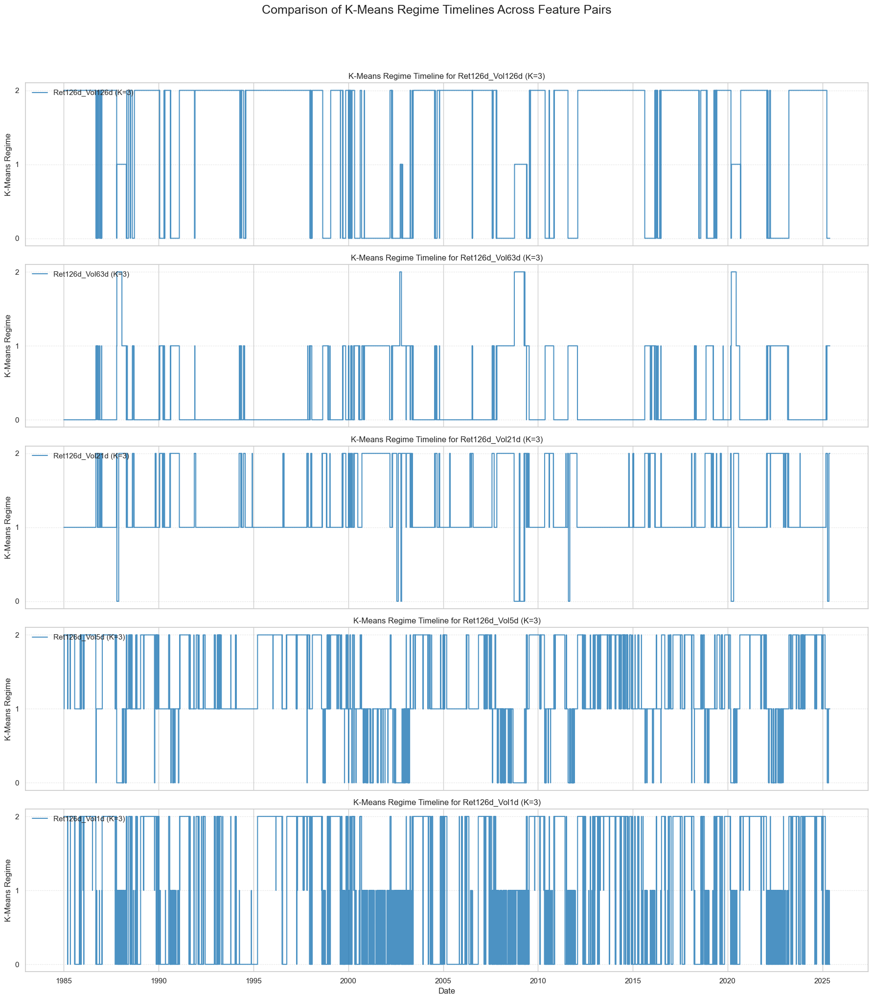

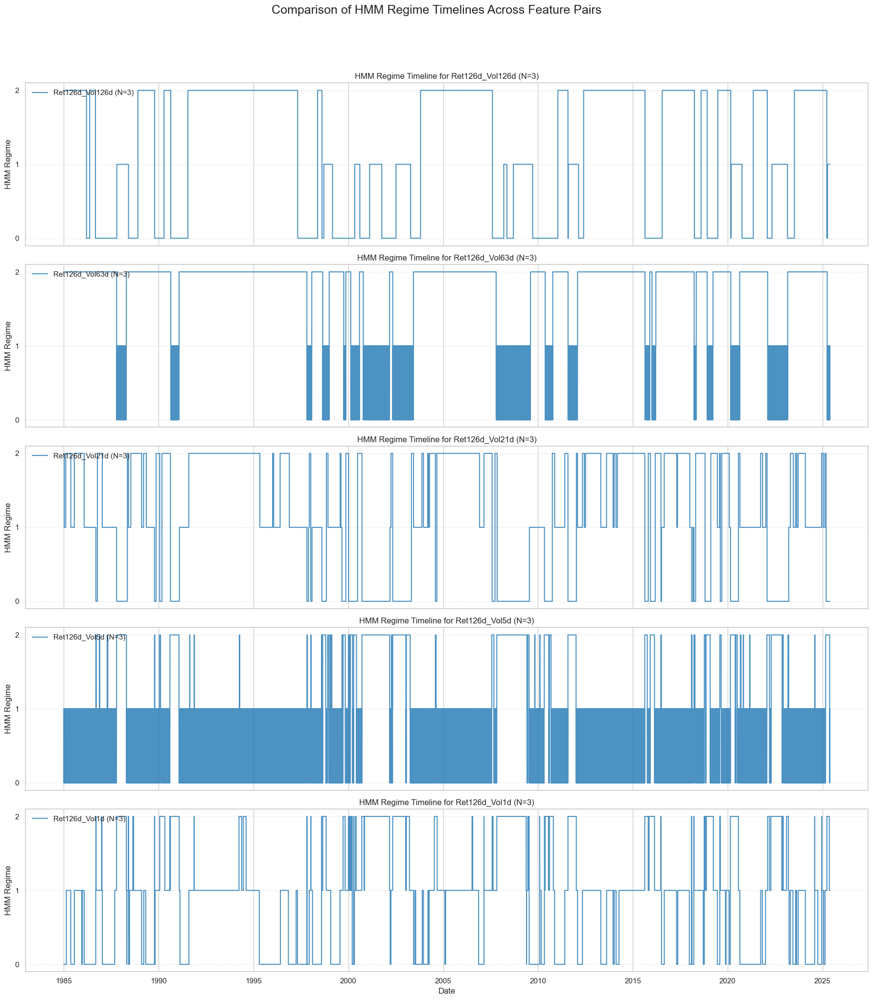

In [17]:
valid_kmeans_results = {k: v for k, v in kmeans_results_all_pairs.items() if v['labels'] is not None}
num_pairs_kmeans = len(valid_kmeans_results)
if num_pairs_kmeans > 0:
    fig_kmeans_timelines, axes_kmeans = plt.subplots(num_pairs_kmeans, 1, figsize=(18, 4 * num_pairs_kmeans), sharex=True)
    if num_pairs_kmeans == 1: 
        axes_kmeans = [axes_kmeans] 
    
    ax_idx = 0
    for pair_name, results in valid_kmeans_results.items():
        ax = axes_kmeans[ax_idx]
        regime_series = results['labels']
        num_clusters = results['model'].n_clusters
        
        ax.plot(regime_series.index, regime_series.values, 
                drawstyle='steps-post', alpha=0.8, lw=1.5, label=f'{pair_name} (K={num_clusters})')
        ax.set_yticks(range(num_clusters))
        ax.set_ylabel('K-Means Regime')
        ax.set_title(f'K-Means Regime Timeline for {pair_name} (K={num_clusters})')
        ax.legend(loc='upper left')
        ax.grid(True, axis='y', linestyle=':', alpha=0.7)
        ax_idx += 1
            
    if ax_idx > 0: 
        axes_kmeans[-1].set_xlabel('Date')
        fig_kmeans_timelines.suptitle('Comparison of K-Means Regime Timelines Across Feature Pairs', fontsize=18, y=1.02)
        plt.tight_layout(rect=[0, 0, 1, 0.98]) 
        plt.show()
else:
    logger.info("No K-Means results available for timeline comparison.")

valid_hmm_results = {k: v for k, v in hmm_results_all_pairs.items() if v['states'] is not None}
num_pairs_hmm = len(valid_hmm_results)
if num_pairs_hmm > 0:
    fig_hmm_timelines, axes_hmm = plt.subplots(num_pairs_hmm, 1, figsize=(18, 4 * num_pairs_hmm), sharex=True)
    if num_pairs_hmm == 1: 
        axes_hmm = [axes_hmm]
        
    ax_idx = 0
    for pair_name, results in valid_hmm_results.items():
        ax = axes_hmm[ax_idx]
        regime_series = results['states']
        num_states = results['model'].n_components
        
        ax.plot(regime_series.index, regime_series.values, 
                drawstyle='steps-post', alpha=0.8, lw=1.5, label=f'{pair_name} (N={num_states})')
        ax.set_yticks(range(num_states))
        ax.set_ylabel('HMM Regime')
        ax.set_title(f'HMM Regime Timeline for {pair_name} (N={num_states})')
        ax.legend(loc='upper left')
        ax.grid(True, axis='y', linestyle=':', alpha=0.7)
        ax_idx += 1
            
    if ax_idx > 0: 
        axes_hmm[-1].set_xlabel('Date')
        fig_hmm_timelines.suptitle('Comparison of HMM Regime Timelines Across Feature Pairs', fontsize=18, y=1.02)
        plt.tight_layout(rect=[0, 0, 1, 0.98])
        plt.show()
else:
    logger.info("No HMM results available for timeline comparison.")

In [14]:
all_performance_dfs = []

for pair_name, results in kmeans_results_all_pairs.items():
    if results.get('performance_summary') is not None:
        df_perf = results['performance_summary'].copy()
        df_perf['feature_pair'] = pair_name
        df_perf['model'] = 'KMeans'
        if 'kmeans_cluster' in df_perf.columns:
            df_perf.rename(columns={'kmeans_cluster': 'regime_label'}, inplace=True)
        elif 'regime_label' not in df_perf.columns:
            logger.warning(f"KMeans performance for {pair_name} missing 'kmeans_cluster', using first column as regime label.")
        all_performance_dfs.append(df_perf)

for pair_name, results in hmm_results_all_pairs.items():
    if results.get('performance_summary') is not None:
        df_perf = results['performance_summary'].copy()
        df_perf['feature_pair'] = pair_name
        df_perf['model'] = 'HMM'
        if 'hmm_state' in df_perf.columns:
             df_perf.rename(columns={'hmm_state': 'regime_label'}, inplace=True)
        elif 'regime_label' not in df_perf.columns:
            logger.warning(f"HMM performance for {pair_name} missing 'hmm_state', using first column as regime label.")
        all_performance_dfs.append(df_perf)

if all_performance_dfs:
    consolidated_perf_df = pd.concat(all_performance_dfs, ignore_index=True)
    if 'regime_label' in consolidated_perf_df.columns:
        consolidated_perf_df = consolidated_perf_df.set_index(['feature_pair', 'model', 'regime_label'])
        
        logger.info("\nConsolidated S&P 500 Performance Statistics Across All Analyses:")
        pd.options.display.float_format = '{:.4f}'.format
        with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.width', 1000):
            print(consolidated_perf_df[['count', 'annualized_return', 'annualized_volatility']].sort_index())
        pd.reset_option('display.float_format')
    else:
        logger.error("'regime_label' column not found in all performance DFs for consolidation.")
        print(consolidated_perf_df.head()) 
else:
    logger.info("No performance summaries available to consolidate.")

2025-05-27 15:59:24,699 - INFO - 
Consolidated S&P 500 Performance Statistics Across All Analyses:


                                     count  annualized_return  annualized_volatility
feature_pair    model  regime_label                                                 
Ret126d_Vol126d HMM    0              3271             0.0855                 0.1828
                       1              1500             0.0684                 0.3227
                       2              5406             0.1268                 0.1170
                KMeans 0              2422            -0.0778                 0.2318
                       1               437             0.0999                 0.4450
                       2              7318             0.1657                 0.1294
Ret126d_Vol21d  HMM    0              2617            -0.0447                 0.2923
                       1              3033             0.2470                 0.1371
                       2              4527             0.0962                 0.1136
                KMeans 0               249             0.1282    